## **Extracting Features**

## **may be there are some blocks which give error while executing they are not the part of presentation**

## **Question 3 Extrcting feraturs ,area and length,width**

In [3]:
import os
import cv2
import numpy as np
import pandas as pd

# Path to the folder containing the images
images_folder = "E7-images"


# Function to create a clear and bold rectangular bounding box around the yellow shapes
def create_bounding_box(image_path):
    # Read the image
    img = cv2.imread(image_path)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for yellow color in HSV
    lower_yellow = np.array([15, 100, 100])
    upper_yellow = np.array([45, 255, 255])

    # Threshold the HSV image to obtain a binary mask for yellow regions
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through each contour and find the minimum area bounding rectangle
    for contour in contours:
        # Find the minimum area bounding rectangle
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        box = np.int0(box)

        # Draw the bounding box with a clear and bold color
        cv2.drawContours(img, [box], 0, (0, 255, 0), 3)

        # Calculate length and width of the bounding box
        length = max(rect[1])
        width = min(rect[1])
    return length, width

def calculate_complexity(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to create a binary mask of yellow regions
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(cv2.cvtColor(image, cv2.COLOR_BGR2HSV), lower_yellow, upper_yellow)

    # Find contours in the mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate complexity based on the number of contours and their area
    total_complexity = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        total_complexity += area

    return total_complexity

def classify_complexity(complexity):
    if complexity <= 150:
        return "Low"
    elif 150 <= complexity < 250:
        return "Medium"
    else:
        return "High"
    
    
def calculate_image_metrics(image):
    # Calculate length and width of the bounding box
    length, width = create_bounding_box(image)
    
    # Calculate area, perimeter, and shape of the bounding polygon
    area, perimeter, shape = create_bounding_polygon(image)
    
    # Calculate complexity
    complexity = calculate_complexity(image)

    return length, width, area, shape, complexity

def create_bounding_polygon(image):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for yellow color in HSV
    lower_yellow = np.array([15, 100, 100])
    upper_yellow = np.array([45, 255, 255])

    # Threshold the HSV image to obtain a binary mask for yellow regions
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through each contour and find the convex hull
    for contour in contours:
        # Find the convex hull
        hull = cv2.convexHull(contour)

        # Draw the convex hull with a clear and bold color
        cv2.drawContours(image, [hull], 0, (0, 255, 0), 3)

        # Calculate area and perimeter of the convex hull
        area = cv2.contourArea(hull) / 10000
        perimeter = cv2.arcLength(hull, True) / 100
        
        shape = perimeter / area

    return area, perimeter, shape



In [4]:
import os
import cv2
import numpy as np
import pandas as pd

# Path to the folder containing the images
images_folder = "E7-images"

# Function to create a clear and bold rectangular bounding box around the yellow shapes
def create_bounding_box(image):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for yellow color in HSV
    lower_yellow = np.array([15, 100, 100])
    upper_yellow = np.array([45, 255, 255])

    # Threshold the HSV image to obtain a binary mask for yellow regions
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through each contour and find the minimum area bounding rectangle
    for contour in contours:
        # Find the minimum area bounding rectangle
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        box = np.int0(box)

        # Draw the bounding box with a clear and bold color
        cv2.drawContours(image, [box], 0, (0, 255, 0), 3)

        # Calculate length and width of the bounding box
        length = max(rect[1])/10
        width = min(rect[1])/10
    return length, width

def calculate_complexity(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to create a binary mask of yellow regions
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(cv2.cvtColor(image, cv2.COLOR_BGR2HSV), lower_yellow, upper_yellow)

    # Find contours in the mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate complexity based on the number of contours and their area
    total_complexity = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        total_complexity += area

    return total_complexity

def classify_complexity(complexity):
    if complexity <= 100:
        return "Low"
    elif 100 <= complexity < 250:
        return "Medium"
    else:
        return "High"
    
def calculate_image_metrics(image_path):
    # Read the image
    img = cv2.imread(image_path)
    
    # Calculate length and width of the bounding box
    length, width = create_bounding_box(img)
    
    # Calculate area, perimeter, and shape of the bounding polygon
    area, perimeter, shape = create_bounding_polygon(img)
    
    # Calculate complexity
    complexity = calculate_complexity(img)

    return length, width, area, shape, complexity

def create_bounding_polygon(image):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for yellow color in HSV
    lower_yellow = np.array([15, 100, 100])
    upper_yellow = np.array([45, 255, 255])

    # Threshold the HSV image to obtain a binary mask for yellow regions
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through each contour and find the convex hull
    for contour in contours:
        # Find the convex hull
        hull = cv2.convexHull(contour)

        # Draw the convex hull with a clear and bold color
        cv2.drawContours(image, [hull], 0, (0, 255, 0), 3)

        # Calculate area and perimeter of the convex hull
        area = cv2.contourArea(hull) / 100
        perimeter = cv2.arcLength(hull, True) / 10
        
        shape = perimeter / area

    return area, perimeter, shape

# Create a DataFrame to store image metrics and labels
data = {'Image': [], 'Length': [], 'Width': [], 'Area': [], 'Shape': [], 'Complexity': []}

# Iterate over each image in the folder
for filename in os.listdir(images_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(images_folder, filename)
        
        # Calculate image metrics
        length, width, area, shape, complexity = calculate_image_metrics(image_path)
        
        # Assign complexity label based on area
        complexity_label = classify_complexity(complexity)

        # Append image metrics and labels to the DataFrame
        data['Image'].append(filename)
        data['Length'].append(length)
        data['Width'].append(width)
        data['Area'].append(area)
        data['Shape'].append(shape)
        data['Complexity'].append(complexity_label)

# Convert the data dictionary to a DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
output_csv = "image_labels.csv"
df.to_csv(output_csv, index=False)


C:\Users\Abhishek\AppData\Local\Temp\ipykernel_10504\1127924390.py:29: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


## **Model Check**

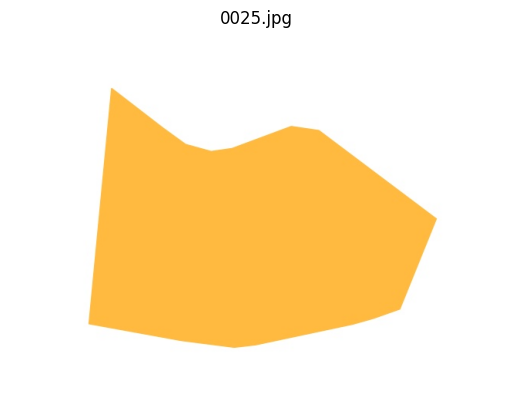

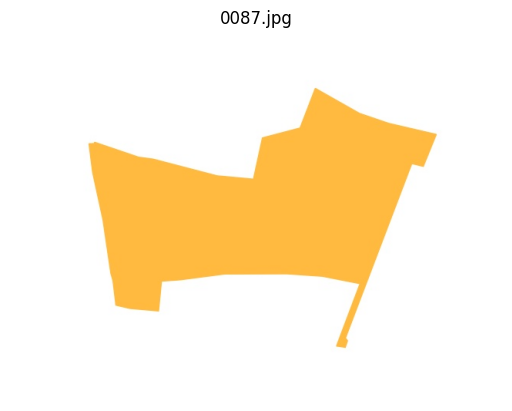

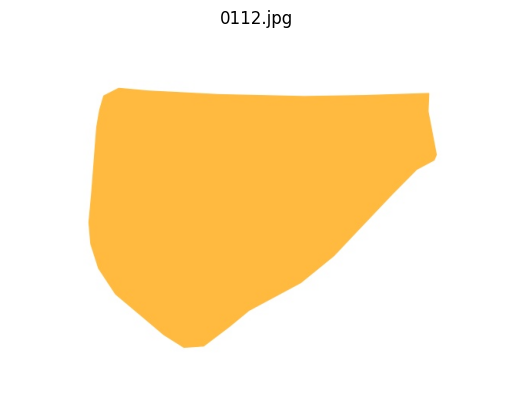

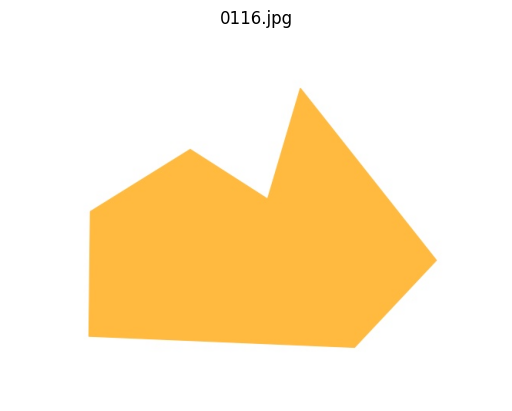

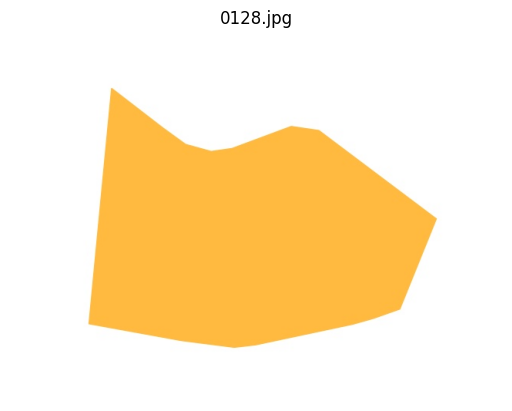

...

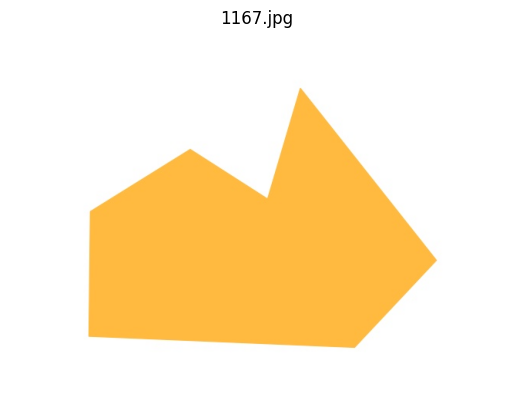

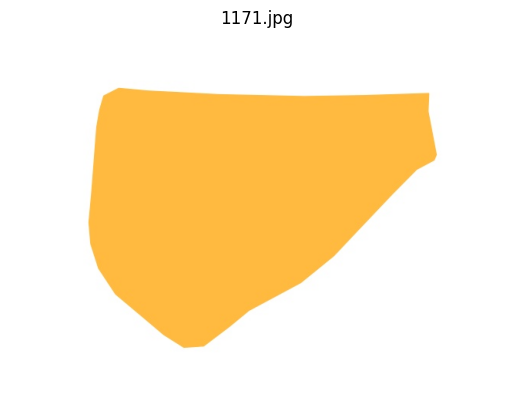

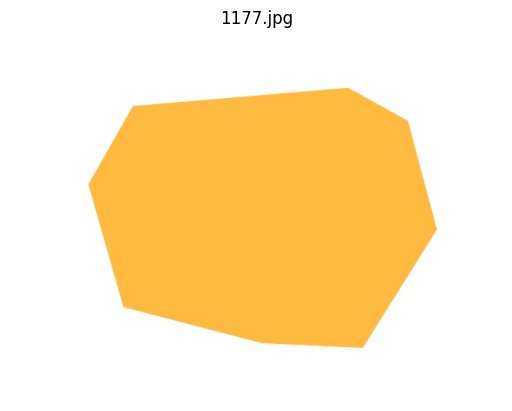

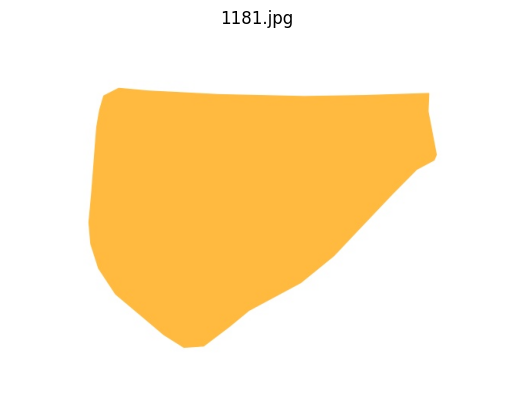

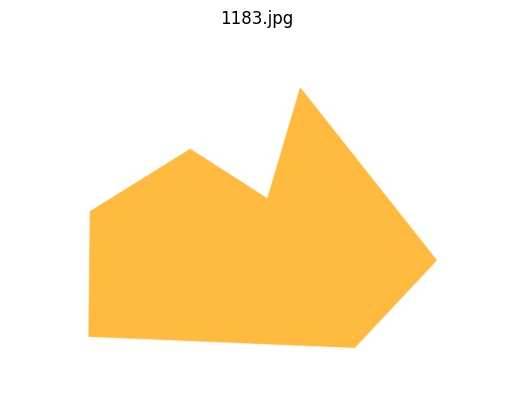

In [5]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file containing image metrics and labels
csv_file = "image_labels.csv"
df = pd.read_csv(csv_file)

def filter_dataframe(length_range, width_range, area_range, complexity):
    # Filter the DataFrame based on the given conditions
    filtered_df = df[(df['Length'].between(length_range[0], length_range[1])) &
                     (df['Width'].between(width_range[0], width_range[1])) &
                     (df['Area'].between(area_range[0], area_range[1])) &
                     (df['Complexity'] == complexity)]
    return filtered_df

def display_images(image_folder, image_names):
    # Iterate through the folder containing the images and display the images
    for image_name in image_names:
        image_path = os.path.join(image_folder, image_name)
        image = cv2.imread(image_path)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(image_name)
        plt.axis('off')
        plt.show()

# Input parameters
length_range = (40, 45)  
width_range = (30, 35)   
area_range = (1000, 1250)   
complexity = "High"     

# Filter the DataFrame
filtered_df = filter_dataframe(length_range, width_range, area_range, complexity)

# Get the image names from the filtered DataFrame
image_names = filtered_df['Image'].tolist()

# Path to the folder containing the images
images_folder = "E7-images"  # Adjust this path to your image folder

# Display the images that meet the specified conditions
display_images(images_folder, image_names)


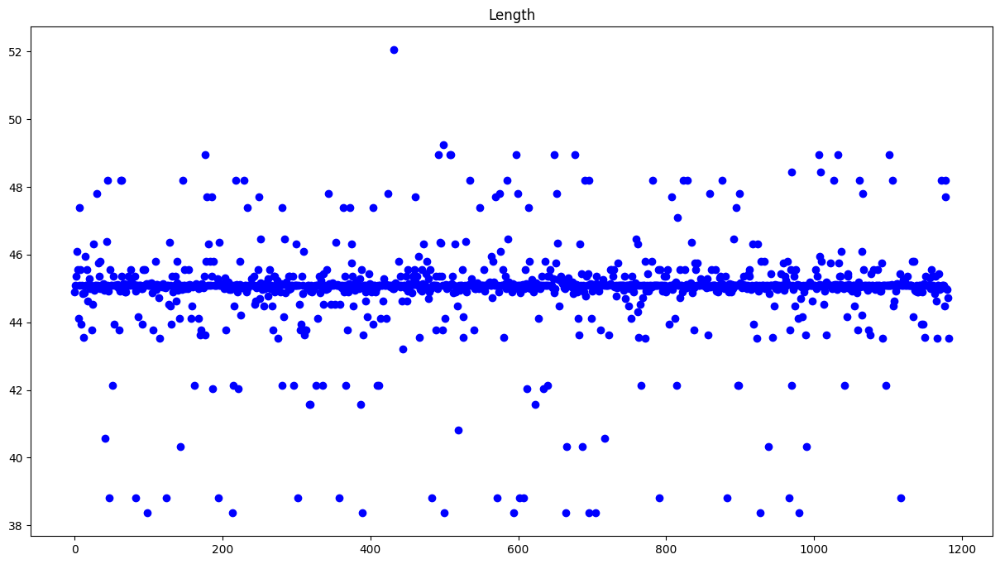

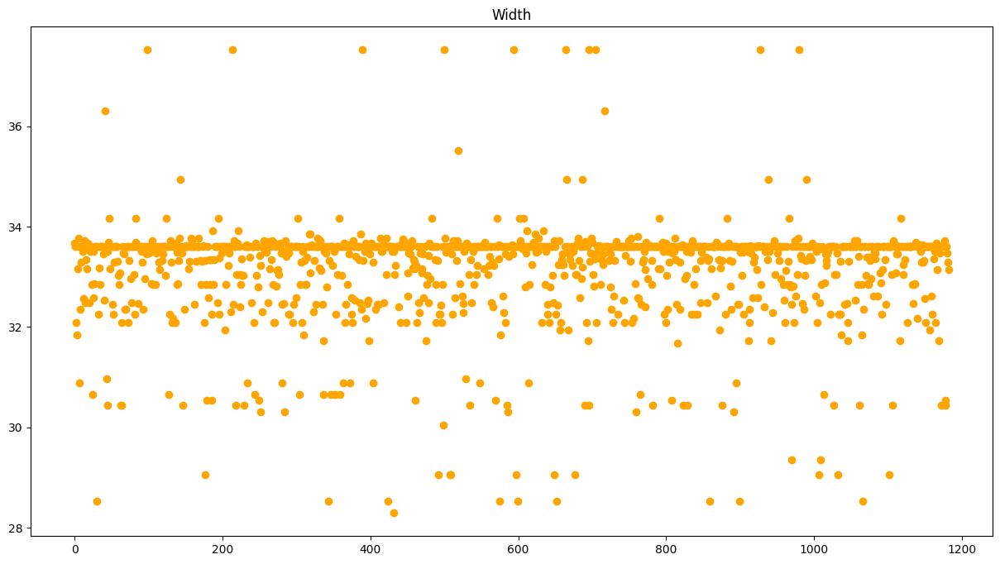

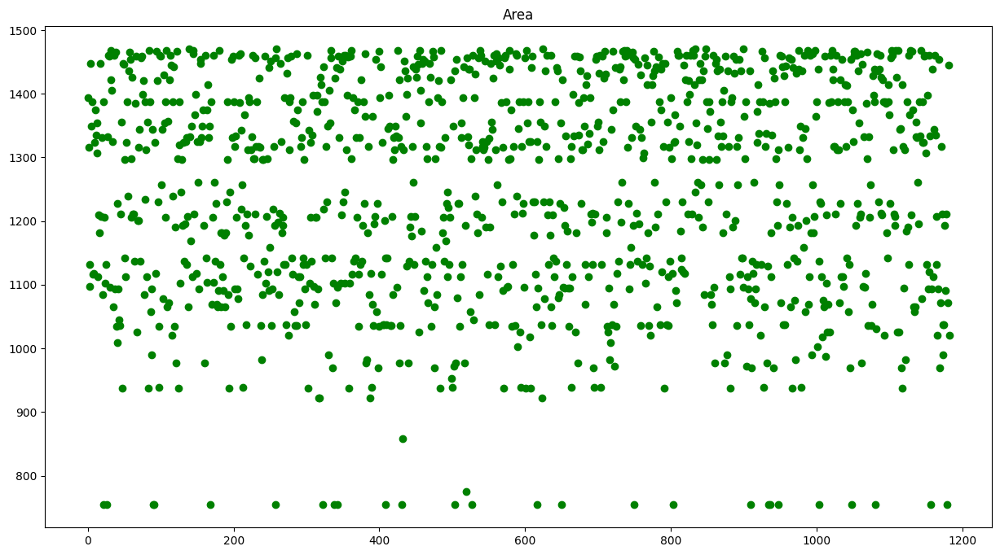

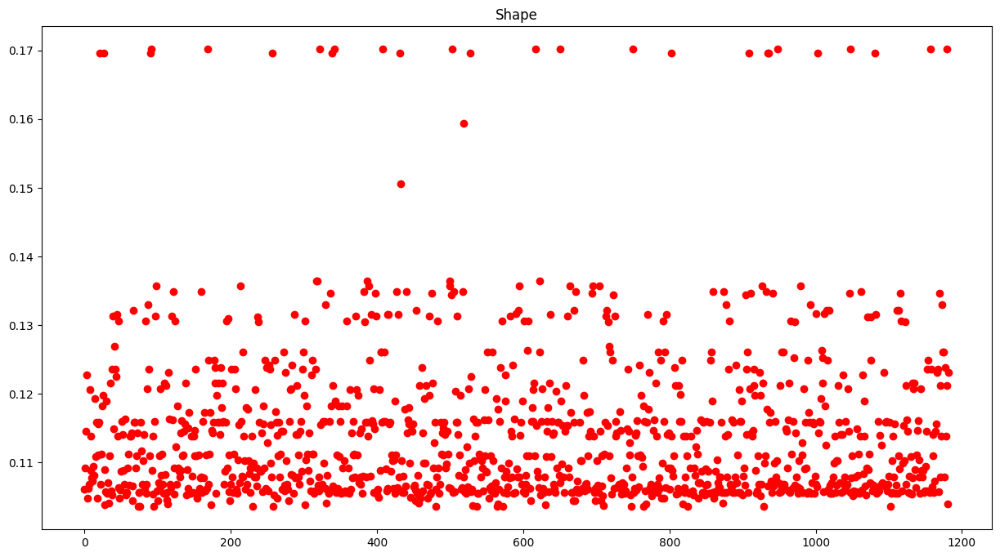

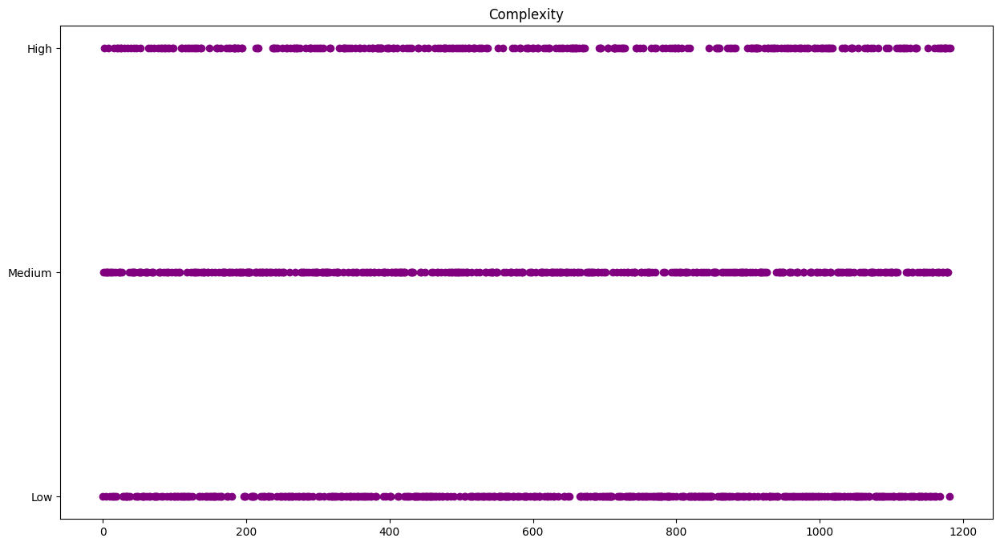

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file containing image metrics and labels
csv_file = "image_labels.csv"
df = pd.read_csv(csv_file)

# Plot Length
plt.figure(figsize=(15, 8))
plt.scatter(df.index, df['Length'], color='blue')
plt.title('Length')
plt.savefig('length_plot.png')  # Save Length plot

# Plot Width
plt.figure(figsize=(15, 8))
plt.scatter(df.index, df['Width'], color='orange')
plt.title('Width')
plt.savefig('width_plot.png')  # Save Width plot

# Plot Area
plt.figure(figsize=(15, 8))
plt.scatter(df.index, df['Area'], color='green')
plt.title('Area')
plt.savefig('area_plot.png')  # Save Area plot

# Plot Shape
plt.figure(figsize=(15, 8))
plt.scatter(df.index, df['Shape'], color='red')
plt.title('Shape')
plt.savefig('shape_plot.png')  # Save Shape plot

# Plot Complexity
plt.figure(figsize=(15, 8))
plt.scatter(df.index, df['Complexity'], color='purple')
plt.title('Complexity')
plt.savefig('complexity_plot.png')  # Save Complexity plot



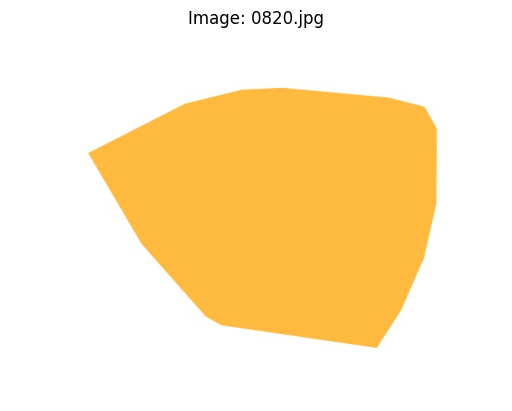

Length: 45.55149841308594
Width: 32.351541137695314
Area: 1117.36
Shape: 0.1138562863951227
Complexity: High




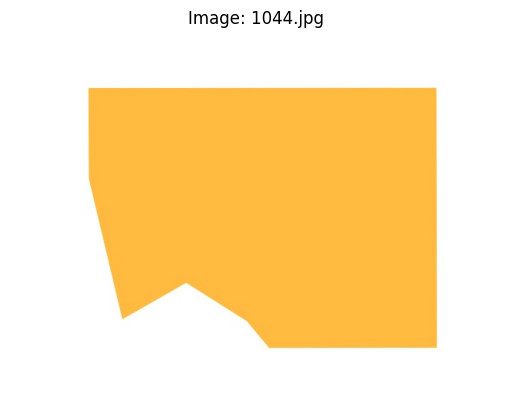

Length: 45.1
Width: 33.6
Area: 1387.87
Shape: 0.106809241302014
Complexity: Medium




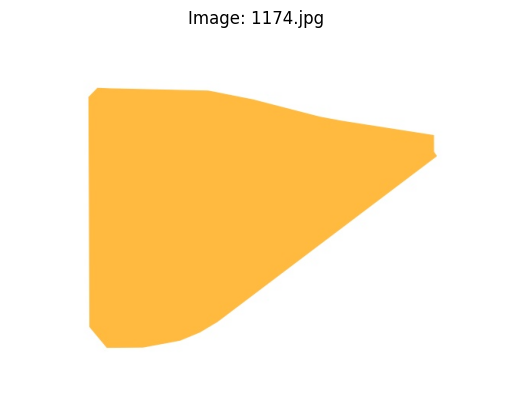

Length: 45.1
Width: 33.6
Area: 990.43
Shape: 0.133013962103352
Complexity: High




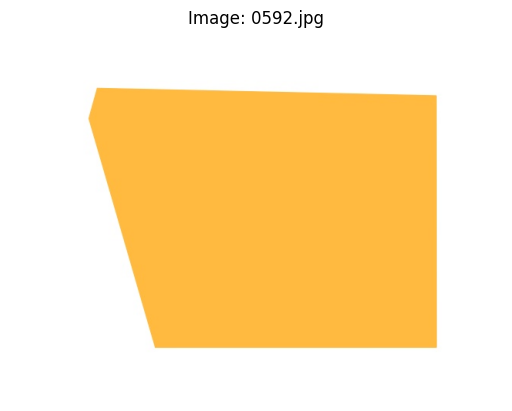

Length: 45.1
Width: 33.6
Area: 1345.17
Shape: 0.1091161511870394
Complexity: Low




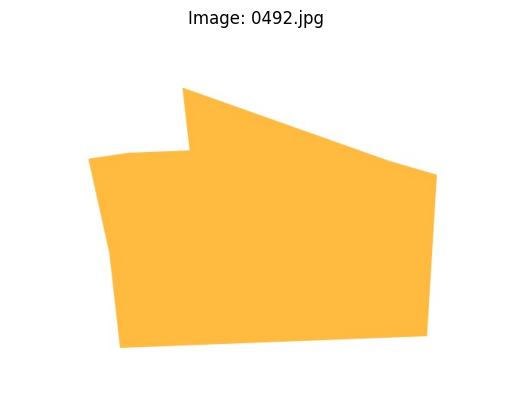

Length: 45.00259399414063
Width: 33.32725219726562
Area: 1168.54
Shape: 0.1150745411118487
Complexity: Medium




In [7]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file containing image metrics and labels
csv_file = "image_labels.csv"
df = pd.read_csv(csv_file)

# Randomly select 5 rows from the DataFrame
selected_rows = df.sample(n=5)

# Plot the images and print their values
for index, row in selected_rows.iterrows():
    image_path = os.path.join(images_folder, row['Image'])
    image = cv2.imread(image_path)
    
    # Plot the image
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Image: {row['Image']}")
    plt.axis('off')
    plt.show()
    
    # Print the image metrics and labels
    print("Length:", row['Length'])
    print("Width:", row['Width'])
    print("Area:", row['Area'])
    print("Shape:", row['Shape'])
    print("Complexity:", row['Complexity'])
    print("\n")

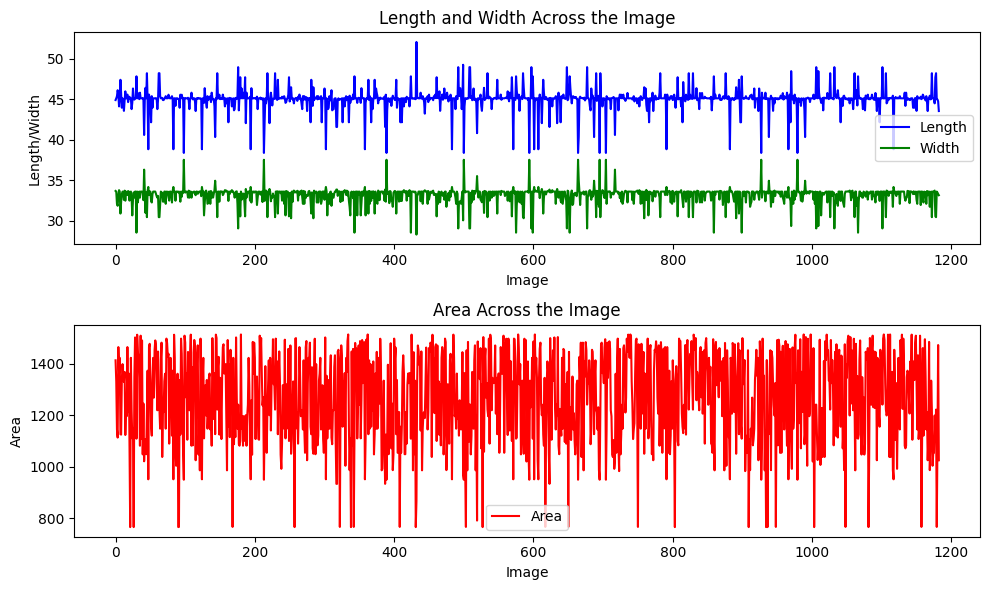

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Load the CSV file
file_path = "bounding_box_data.csv"  # Update this with your file path
data = pd.read_csv(file_path)

# Step 2: Extract the data
length = data['Length']
width = data['Width']
area = data['Area']

# Step 3: Plot the data
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(length, label='Length', color='blue')
plt.plot(width, label='Width', color='green')
plt.title('Length and Width Across the Image')
plt.xlabel('Image')
plt.ylabel('Length/Width')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(area, label='Area', color='red')
plt.title('Area Across the Image')
plt.xlabel('Image')
plt.ylabel('Area')
plt.legend()

plt.tight_layout()
plt.show()


Bounding Polygon - Area: 1414.25


C:\Users\Abhishek\AppData\Local\Temp\ipykernel_10504\1482343676.py:34: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


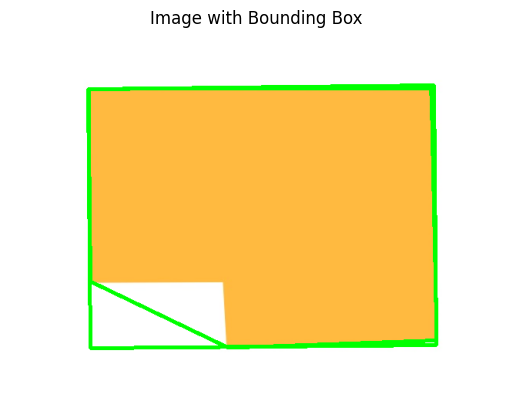

Bounding Polygon - Area: 1331.95


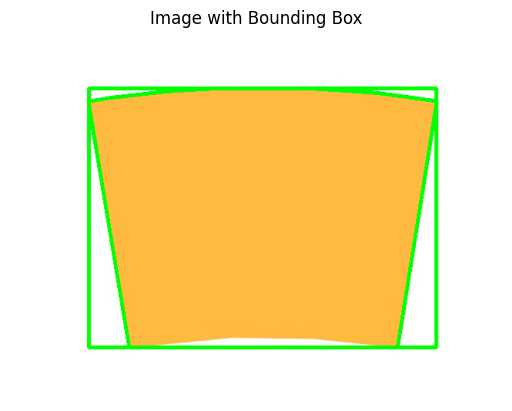

Bounding Polygon - Area: 1144.86


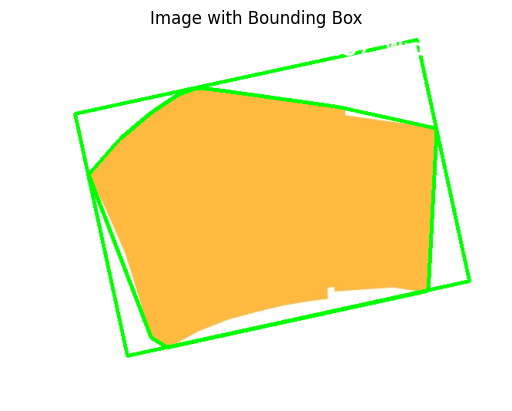

Bounding Polygon - Area: 1113.405


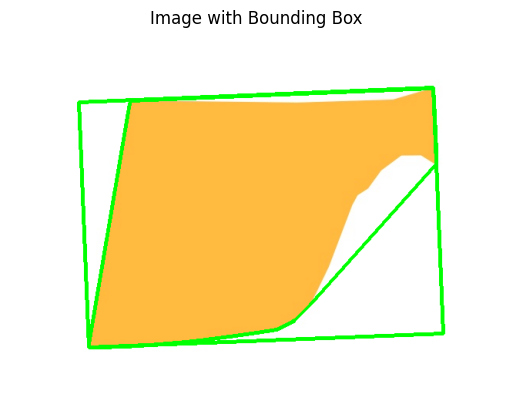

Bounding Polygon - Area: 1465.84


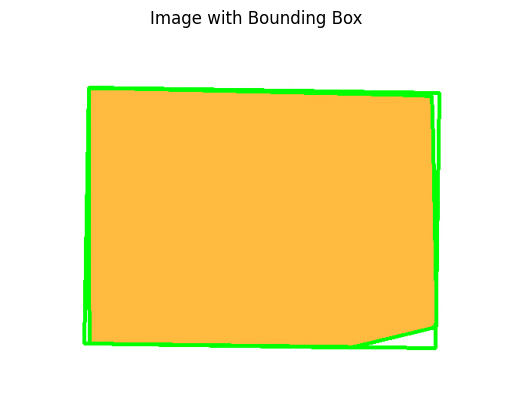

In [9]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Path to the folder containing the images
images_folder = "E7-images"
output_csv = "bounding_box_data.csv"

# Function to create a bounding box around yellow shapes and save area, length, and width
def create_bounding_box(image_path):
    # Read the image
    img = cv2.imread(image_path)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for yellow color in HSV
    lower_yellow = np.array([15, 100, 100])
    upper_yellow = np.array([45, 255, 255])

    # Threshold the HSV image to obtain a binary mask for yellow regions
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through each contour and find the minimum area bounding rectangle
    for contour in contours:
        # Find the minimum area bounding rectangle
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        box = np.int0(box)

        # Draw the bounding box with a clear and bold color
        cv2.drawContours(img, [box], 0, (0, 255, 0), 3)

        # Calculate area, length, and width of the bounding box
        length = max(rect[1]) / 10
        width = min(rect[1]) / 10
        
    for contour in contours:
        # Find the convex hull
        hull = cv2.convexHull(contour)

        # Draw the convex hull with a clear and bold color
        cv2.drawContours(img, [hull], 0, (0, 255, 0), 3)

        # Calculate area of the convex hull
        area = cv2.contourArea(hull)/100
        print(f"Bounding Polygon - Area: {area}")
        

        
      
    
        # Print area, length, and width on the image
        cv2.putText(img, f"Area: {area:.2f} Length: {length:.2f} Width: {width:.2f}", 
                    (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

      
# Create a DataFrame to store the data
        data = {'Image': [os.path.basename(image_path)], 'Area': [area], 'Length': [length], 'Width': [width]}
  # Display the image with the bounding box and text
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Image with Bounding Box")
        plt.axis('off')
        plt.show()

j=0

# Iterate over each image in the folder
for filename in os.listdir(images_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(images_folder, filename)
        create_bounding_box(image_path)
    j=j+1
    
    if j==5:
        break

## **Question 2 - Classification**

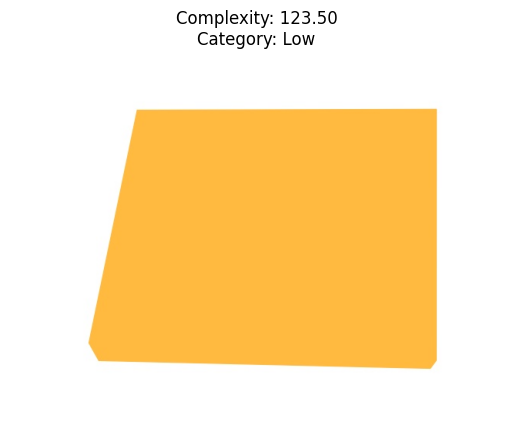

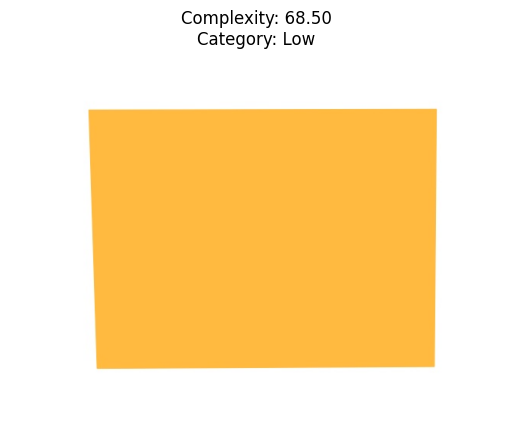

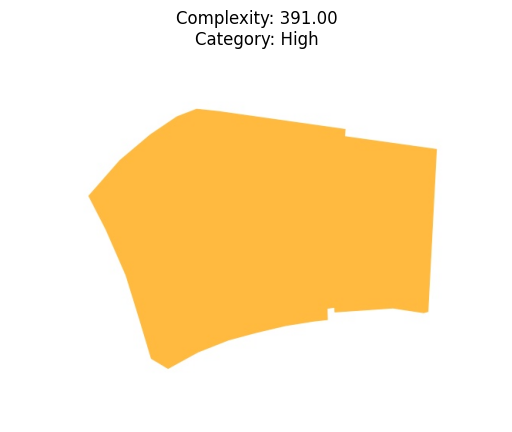

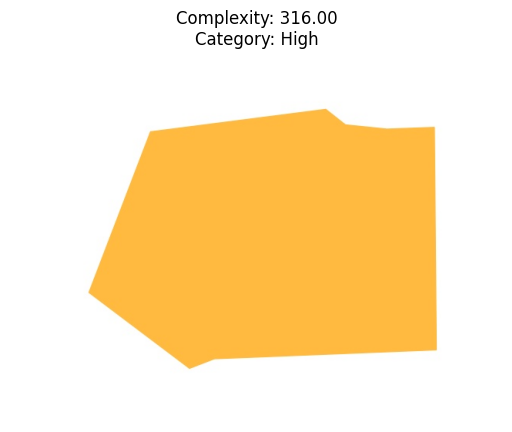

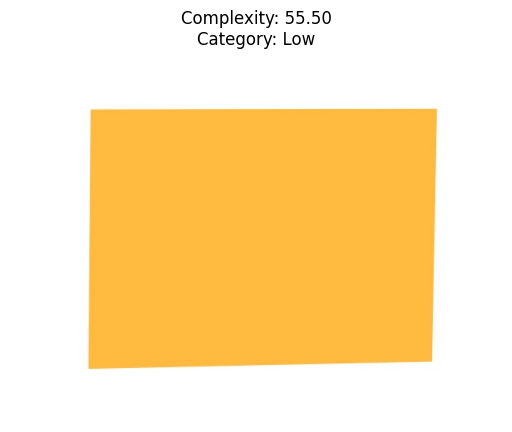

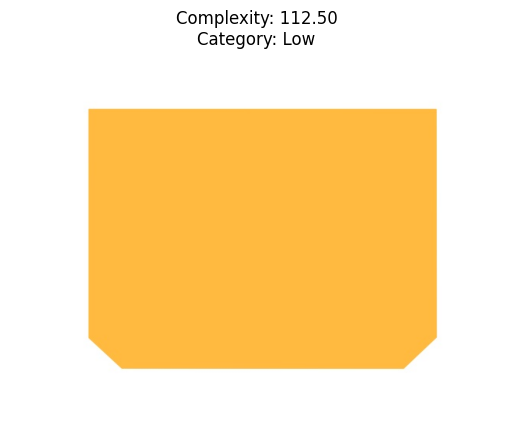

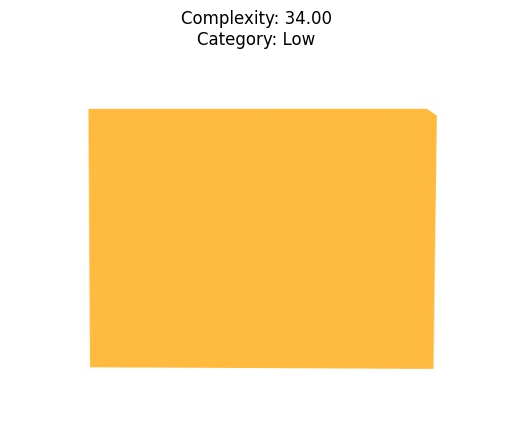

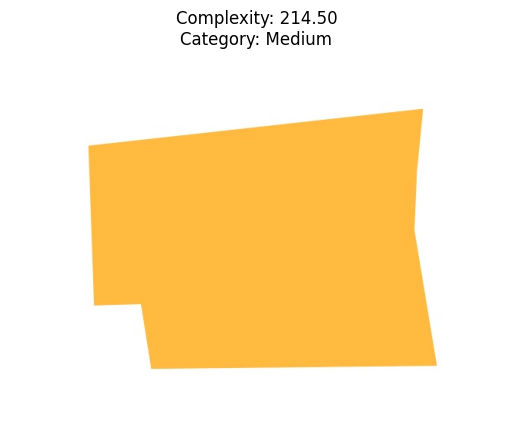

In [30]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

def calculate_complexity(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to create a binary mask of yellow regions
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(cv2.cvtColor(image, cv2.COLOR_BGR2HSV), lower_yellow, upper_yellow)

    # Find contours in the mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate complexity based on the number of contours and their area
    total_complexity = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        total_complexity += area

    return total_complexity

def classify_complexity(complexity):
    if complexity <= 150:
        return "Low"
    elif 150 <= complexity < 50:
        return "Medium"
    else:
        return "High"

def main():
    # Path to the folder containing images
    folder_path = "E7-images"

    # List all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Select 5 random images
    selected_images = random.sample(image_files, 5)

    for image_file in selected_images:
        # Read the image
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)

        # Calculate complexity level
        complexity = calculate_complexity(image)

        # Classify complexity into low, medium, or high
        complexity_category = classify_complexity(complexity)

        # Display the image, complexity value, and category
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"Complexity: {complexity:.2f}\nCategory: {complexity_category}")
        plt.axis('off')
        plt.show()

if __name__ == "__main__":
    main()


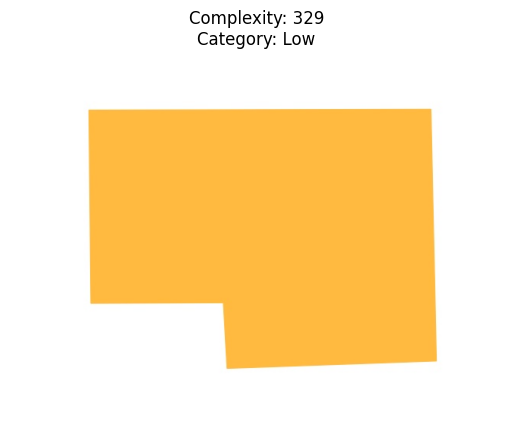

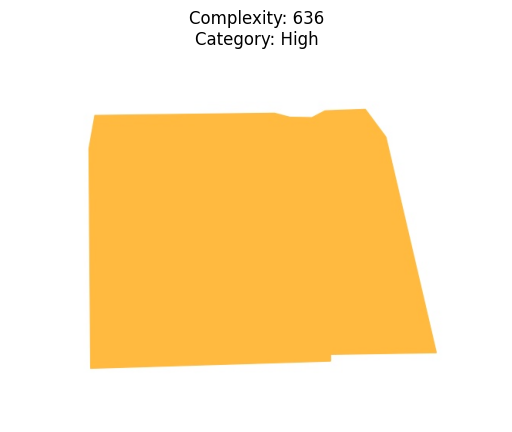

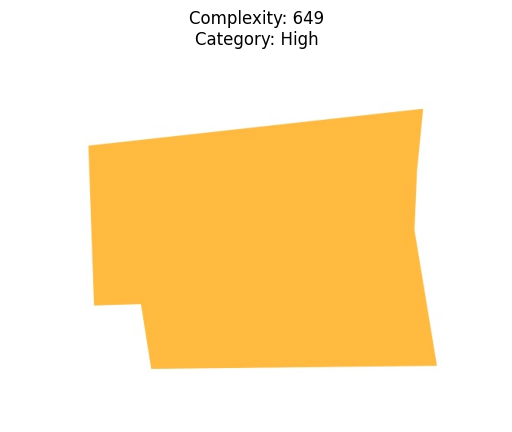

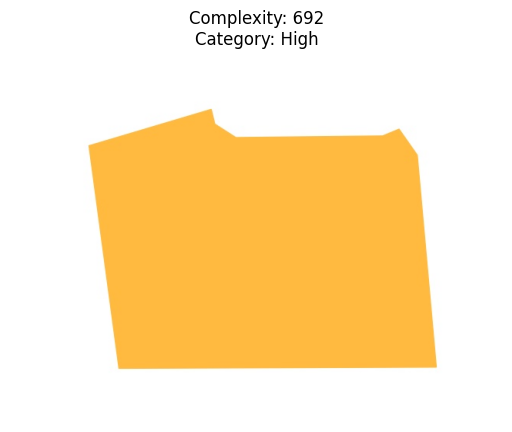

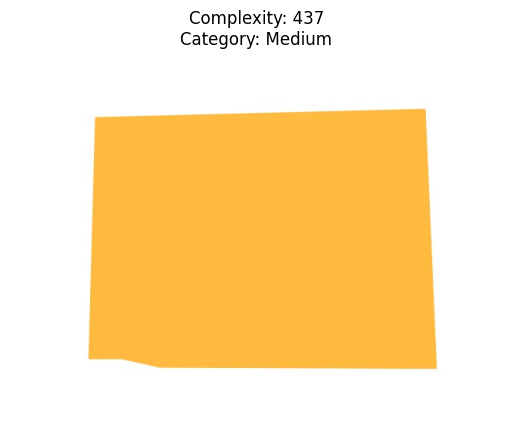

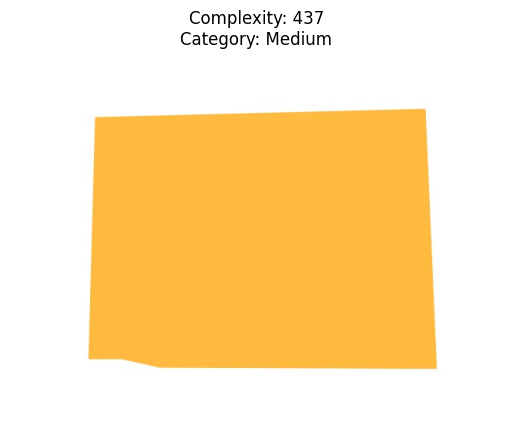

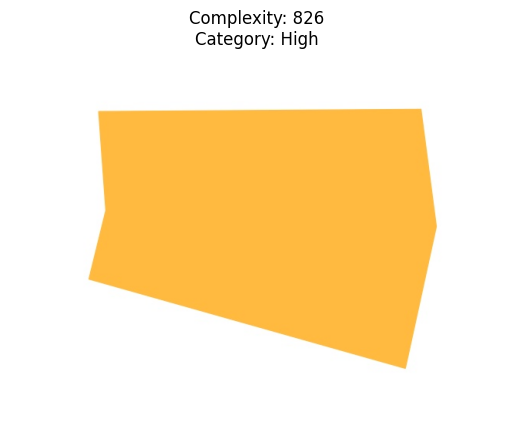

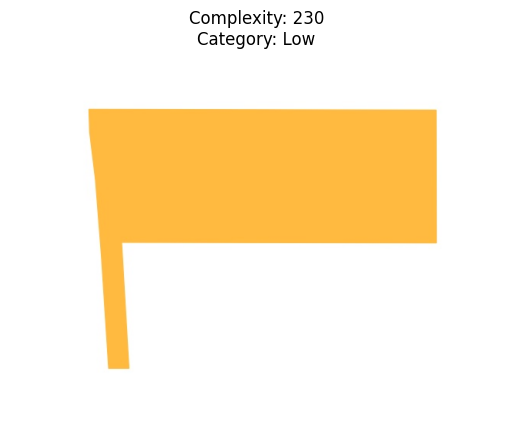

In [32]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

def calculate_complexity(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to create a binary mask of yellow regions
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(cv2.cvtColor(image, cv2.COLOR_BGR2HSV), lower_yellow, upper_yellow)

    # Find contours in the mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate complexity based on the number of vertices in contours
    total_vertices = 0
    for contour in contours:
        # Approximate the contour to reduce the number of vertices
        epsilon = 0.01 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)
        total_vertices += len(approx)

    return total_vertices

def classify_complexity(complexity):
    if complexity <= 400:
        return "Low"
    elif 300 < complexity <= 550:
        return "Medium"
    else:
        return "High"


folder_path = "E7-images"

    # List all image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Select 5 random images
selected_images = random.sample(image_files, 8)

for image_file in selected_images:
        # Read the image
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)

        # Calculate complexity level
        complexity = calculate_complexity(image)

        # Classify complexity into low, medium, or high
        complexity_category = classify_complexity(complexity)

        # Display the image, complexity value, and category
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"Complexity: {complexity}\nCategory: {complexity_category}")
        plt.axis('off')
        plt.show()




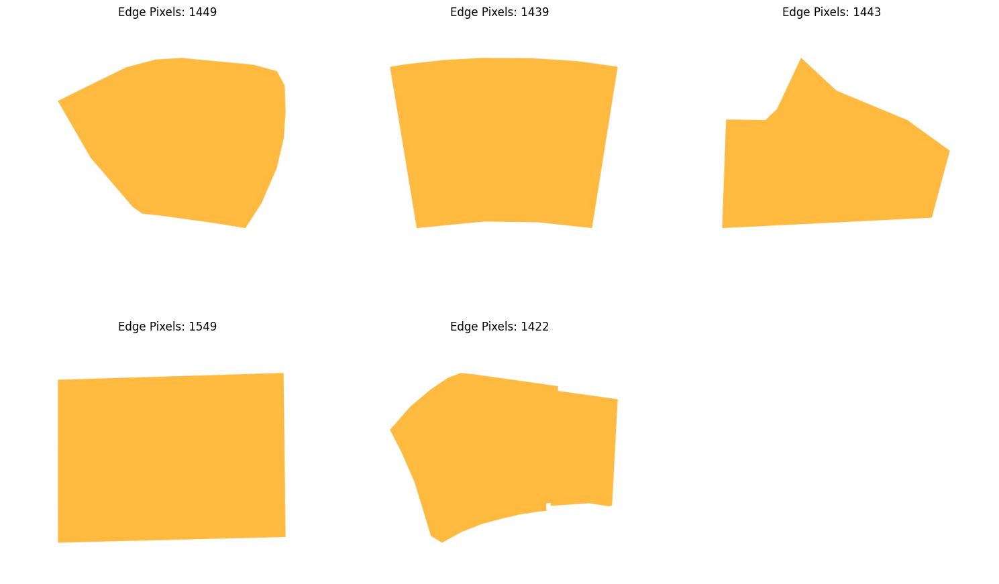

In [45]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

def extract_edge_pixels(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Canny edge detection
    edges = cv2.Canny(gray, 50, 150)
    # Count number of edge pixels
    num_edge_pixels = np.count_nonzero(edges)
    return num_edge_pixels

# Path to the folder containing images
folder_path = "E7-images"

# List all image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Select 5 random image files
selected_image_files = random.sample(image_files, min(5, len(image_files)))

# Plot the images with annotations
plt.figure(figsize=(15, 10))
for i, image_file in enumerate(selected_image_files):
    # Read the image
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)

    # Extract number of edge pixels
    num_edge_pixels = extract_edge_pixels(image)

    # Annotate the image with the number of edge pixels
    plt.subplot(2, 3, i + 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Edge Pixels: {num_edge_pixels}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [58]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
import pandas as pd

def extract_edge_pixels(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Canny edge detection
    edges = cv2.Canny(gray, 50, 150)
    # Count number of edge pixels
    num_edge_pixels = np.count_nonzero(edges)
    return num_edge_pixels

def calculate_complexity_vert(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to create a binary mask of yellow regions
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(cv2.cvtColor(image, cv2.COLOR_BGR2HSV), lower_yellow, upper_yellow)

    # Find contours in the mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate complexity based on the number of vertices in contours
    total_vertices = 0
    for contour in contours:
        # Approximate the contour to reduce the number of vertices
        epsilon = 0.01 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)
        total_vertices += len(approx)

    return total_vertices

def calculate_complexity(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to create a binary mask of yellow regions
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(cv2.cvtColor(image, cv2.COLOR_BGR2HSV), lower_yellow, upper_yellow)

    # Find contours in the mask
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate complexity based on the number of contours and their area
    total_complexity = 0
    for contour in contours:
        area = cv2.contourArea(contour)
        total_complexity += area

    return total_complexity

# Path to the folder containing images
folder_path = "E7-images"

# List all image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Store the edge pixel data and corresponding file names
data = []

# Plot the images with annotations
plt.figure(figsize=(15, 10))
for i, image_file in enumerate(image_files):
    # Read the image
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)

    # Extract number of edge pixels
    num_edge_pixels = extract_edge_pixels(image)
    ver=calculate_complexity_vert(image)
    comp=calculate_complexity(image)
    # Store the edge pixel data and corresponding file name
    data.append([image_file, num_edge_pixels,ver,comp])
    
# Convert the edge pixel data to a DataFrame
df = pd.DataFrame(data, columns=['Picture', 'Edge Pixels',"Complex_vert","complex"])

# Define a function to normalize values between 0 and 1
def normalize_values(data):
    min_val = min(data)
    max_val = max(data)
    normalized_data = [(x - min_val) / (max_val - min_val) for x in data]
    return normalized_data

# Normalize the edge pixels, complexity_vert, and complexity values
df['Edge Pixels Normalized'] = normalize_values(df['Edge Pixels'])
df['Complex_vert Normalized'] = normalize_values(df['Complex_vert'])
df['complex Normalized'] = normalize_values(df['complex'])

# Plot the graph of normalized values vs image names
plt.scatter(df['Picture'], df['Edge Pixels Normalized'], label='Edge Pixels')
plt.scatter(df['Picture'], df['Complex_vert Normalized'], label='Complexity_vert')
plt.scatter(df['Picture'], df['complex Normalized'], label='Complexity')
plt.xlabel('Image')
plt.ylabel('Normalized Values')
plt.xticks(rotation=90)
plt.title('Normalized Values vs Image Names')
plt.legend()
plt.tight_layout()
plt.show()

# Save the DataFrame to a CSV file
csv_file_path = "edge_pixel_data.csv"
df.to_csv(csv_file_path, index=False)




TypeError: scatter() missing 1 required positional argument: 'y'

<Figure size 1500x1000 with 0 Axes>

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


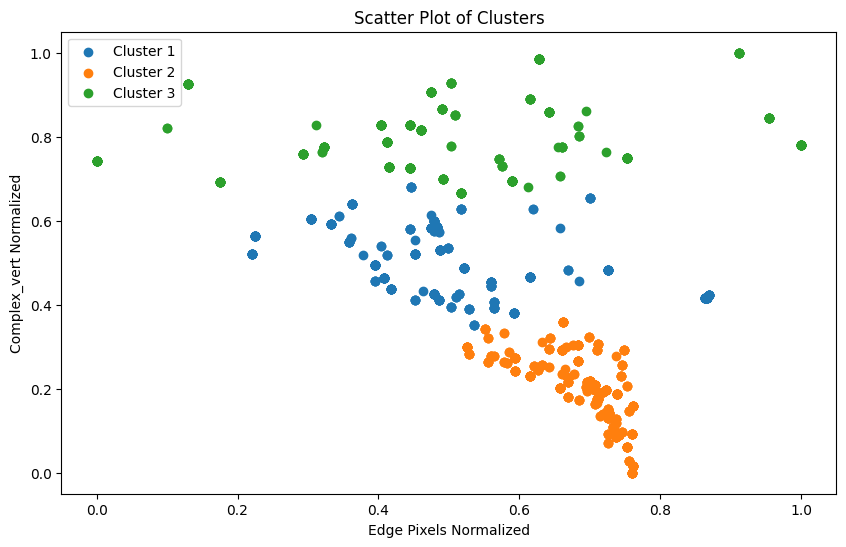

Cluster Centroids:
   Edge Pixels Normalized  Complex_vert Normalized  complex Normalized
0                0.500753                 0.499795            0.461997
1                0.688436                 0.199158            0.149861
2                0.509070                 0.798481            0.808502


c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\

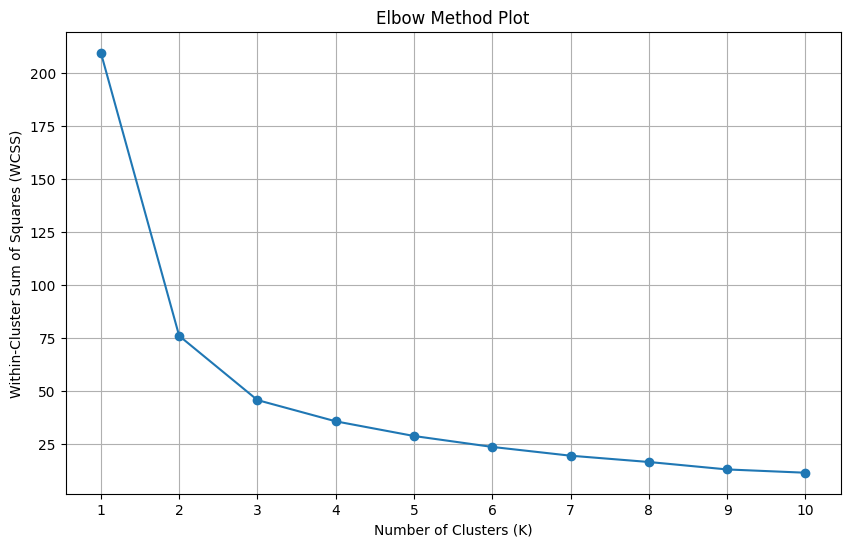

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\

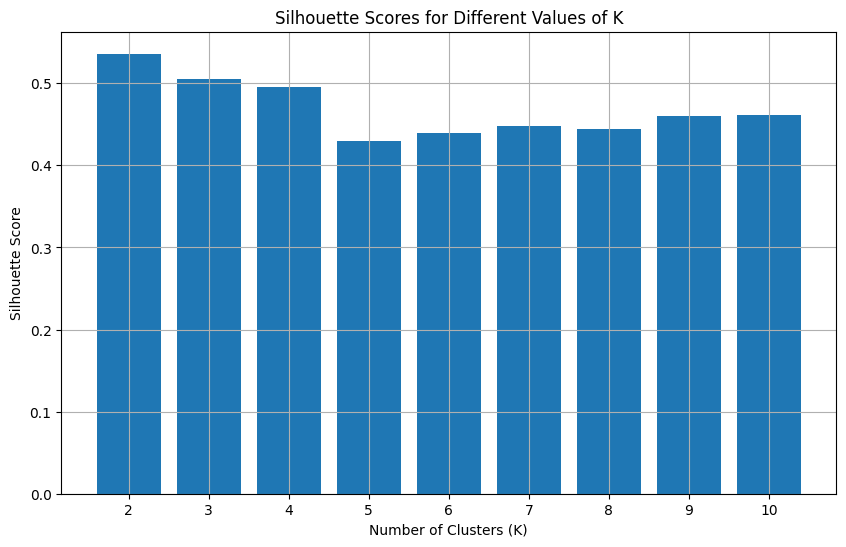

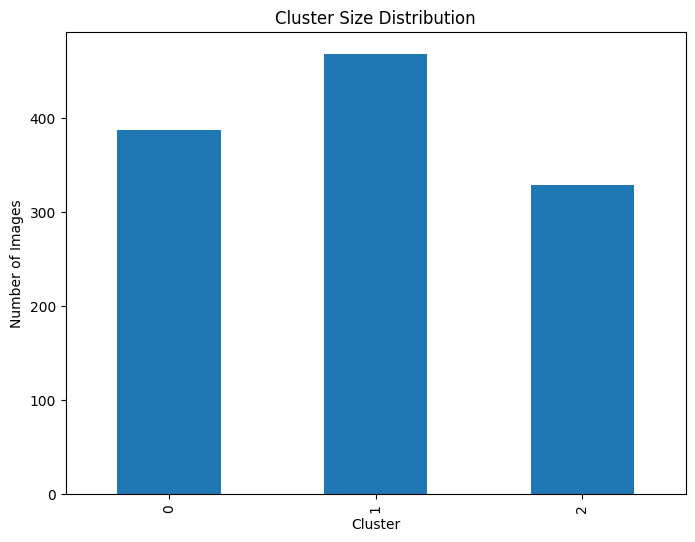

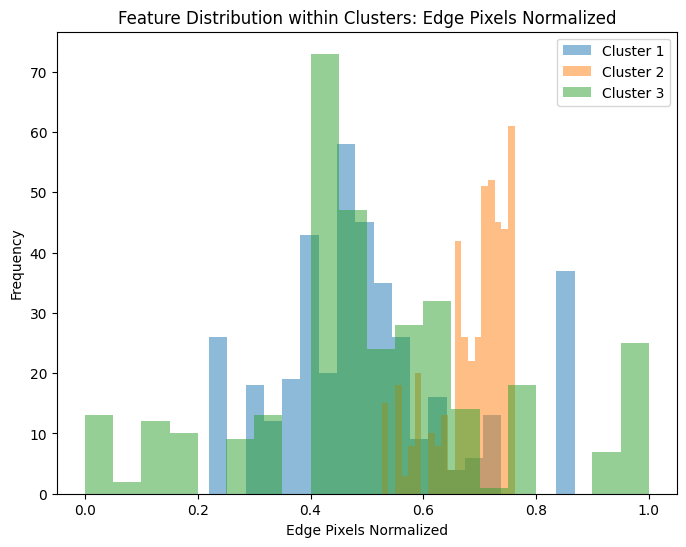

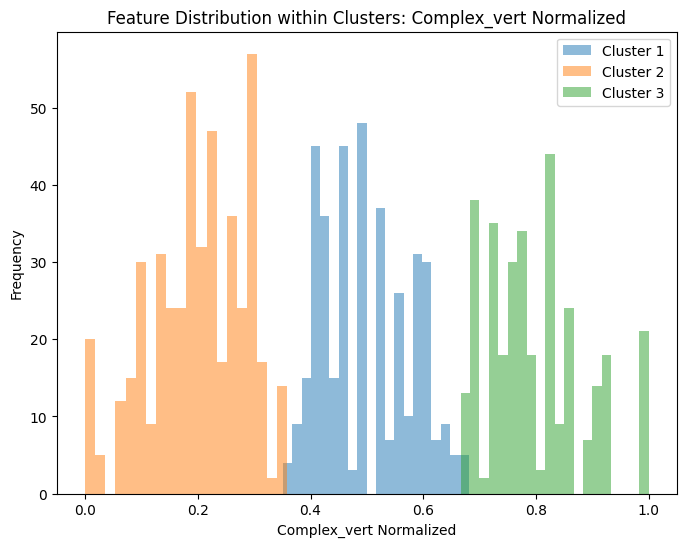

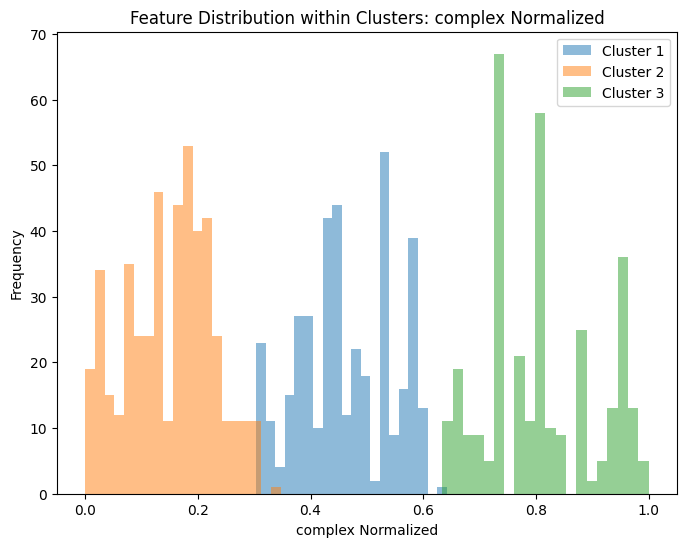

TypeError: Could not convert 0002.jpg0004.jpg0006.jpg0007.jpg0008.jpg0010.jpg0012.jpg0013.jpg0016.jpg0019.jpg0023.jpg0024.jpg0026.jpg0028.jpg0038.jpg0040.jpg0041.jpg0043.jpg0045.jpg0047.jpg0051.jpg0052.jpg0054.jpg0055.jpg0056.jpg0060.jpg0061.jpg0068.jpg0069.jpg0070.jpg0071.jpg0079.jpg0080.jpg0081.jpg0083.jpg0086.jpg0089.jpg0093.jpg0097.jpg0098.jpg0107.jpg0108.jpg0117.jpg0118.jpg0120.jpg0124.jpg0127.jpg0129.jpg0130.jpg0132.jpg0134.jpg0138.jpg0141.jpg0142.jpg0143.jpg0152.jpg0153.jpg0158.jpg0163.jpg0168.jpg0170.jpg0172.jpg0175.jpg0177.jpg0180.jpg0182.jpg0187.jpg0188.jpg0191.jpg0192.jpg0193.jpg0196.jpg0197.jpg0201.jpg0202.jpg0203.jpg0204.jpg0205.jpg0206.jpg0215.jpg0220.jpg0222.jpg0223.jpg0225.jpg0228.jpg0229.jpg0234.jpg0235.jpg0237.jpg0238.jpg0241.jpg0242.jpg0246.jpg0247.jpg0250.jpg0253.jpg0254.jpg0262.jpg0269.jpg0277.jpg0278.jpg0281.jpg0282.jpg0285.jpg0288.jpg0293.jpg0295.jpg0297.jpg0298.jpg0299.jpg0301.jpg0306.jpg0307.jpg0309.jpg0311.jpg0313.jpg0314.jpg0315.jpg0317.jpg0326.jpg0327.jpg0329.jpg0330.jpg0336.jpg0349.jpg0351.jpg0354.jpg0356.jpg0362.jpg0364.jpg0368.jpg0370.jpg0372.jpg0373.jpg0375.jpg0379.jpg0380.jpg0386.jpg0393.jpg0394.jpg0395.jpg0398.jpg0400.jpg0404.jpg0405.jpg0408.jpg0410.jpg0412.jpg0415.jpg0416.jpg0417.jpg0418.jpg0420.jpg0422.jpg0423.jpg0430.jpg0431.jpg0434.jpg0444.jpg0445.jpg0448.jpg0450.jpg0455.jpg0459.jpg0462.jpg0467.jpg0469.jpg0472.jpg0473.jpg0478.jpg0483.jpg0485.jpg0487.jpg0489.jpg0492.jpg0493.jpg0495.jpg0496.jpg0498.jpg0502.jpg0508.jpg0509.jpg0510.jpg0511.jpg0515.jpg0522.jpg0527.jpg0533.jpg0534.jpg0541.jpg0543.jpg0544.jpg0545.jpg0549.jpg0550.jpg0555.jpg0560.jpg0569.jpg0570.jpg0571.jpg0577.jpg0578.jpg0581.jpg0583.jpg0585.jpg0587.jpg0589.jpg0594.jpg0596.jpg0598.jpg0599.jpg0605.jpg0612.jpg0613.jpg0614.jpg0615.jpg0620.jpg0622.jpg0626.jpg0628.jpg0630.jpg0632.jpg0634.jpg0635.jpg0638.jpg0639.jpg0640.jpg0642.jpg0646.jpg0647.jpg0649.jpg0654.jpg0657.jpg0659.jpg0661.jpg0663.jpg0664.jpg0668.jpg0670.jpg0675.jpg0678.jpg0679.jpg0680.jpg0682.jpg0684.jpg0687.jpg0692.jpg0700.jpg0701.jpg0702.jpg0712.jpg0714.jpg0715.jpg0726.jpg0728.jpg0732.jpg0733.jpg0734.jpg0739.jpg0742.jpg0743.jpg0744.jpg0753.jpg0757.jpg0760.jpg0762.jpg0763.jpg0764.jpg0767.jpg0771.jpg0774.jpg0779.jpg0785.jpg0794.jpg0796.jpg0797.jpg0799.jpg0802.jpg0805.jpg0808.jpg0813.jpg0814.jpg0815.jpg0817.jpg0829.jpg0835.jpg0838.jpg0839.jpg0845.jpg0852.jpg0853.jpg0854.jpg0855.jpg0864.jpg0869.jpg0870.jpg0873.jpg0880.jpg0882.jpg0884.jpg0889.jpg0891.jpg0892.jpg0896.jpg0898.jpg0899.jpg0903.jpg0907.jpg0915.jpg0917.jpg0918.jpg0919.jpg0920.jpg0923.jpg0925.jpg0927.jpg0940.jpg0944.jpg0945.jpg0946.jpg0948.jpg0958.jpg0960.jpg0962.jpg0968.jpg0970.jpg0971.jpg0978.jpg0979.jpg0987.jpg0988.jpg0998.jpg1001.jpg1006.jpg1007.jpg1010.jpg1015.jpg1016.jpg1019.jpg1025.jpg1029.jpg1031.jpg1033.jpg1038.jpg1039.jpg1041.jpg1042.jpg1044.jpg1057.jpg1060.jpg1065.jpg1071.jpg1072.jpg1073.jpg1074.jpg1076.jpg1083.jpg1086.jpg1091.jpg1093.jpg1095.jpg1098.jpg1100.jpg1102.jpg1106.jpg1109.jpg1112.jpg1114.jpg1122.jpg1124.jpg1125.jpg1131.jpg1137.jpg1138.jpg1140.jpg1141.jpg1146.jpg1148.jpg1151.jpg1154.jpg1157.jpg1159.jpg1164.jpg1166.jpg1168.jpg1172.jpg1178.jpg to numeric

In [103]:
from sklearn.cluster import KMeans
import shutil

# Combine the normalized features into a single feature matrix
X = df[['Edge Pixels Normalized', 'Complex_vert Normalized', 'complex Normalized']]

# Apply K-means clustering with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(X)

# Scatter Plot of Clusters
plt.figure(figsize=(10, 6))
for cluster_num in range(3):
    cluster_df = df[df['Cluster'] == cluster_num]
    plt.scatter(cluster_df['Edge Pixels Normalized'], cluster_df['Complex_vert Normalized'], label=f'Cluster {cluster_num + 1}')
plt.xlabel('Edge Pixels Normalized')
plt.ylabel('Complex_vert Normalized')
plt.title('Scatter Plot of Clusters')
plt.legend()
plt.show()

# Cluster Centroids
centroid_df = pd.DataFrame(kmeans.cluster_centers_, columns=['Edge Pixels Normalized', 'Complex_vert Normalized', 'complex Normalized'])
print("Cluster Centroids:")
print(centroid_df)

# Elbow Method Plot
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method Plot')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

# Silhouette Scores
from sklearn.metrics import silhouette_score
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_scores.append(silhouette_score(X, labels))
plt.figure(figsize=(10, 6))
plt.bar(range(2, 11), silhouette_scores)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different Values of K')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# Cluster Size Distribution
plt.figure(figsize=(8, 6))
df['Cluster'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Cluster')
plt.ylabel('Number of Images')
plt.title('Cluster Size Distribution')
plt.show()

# Feature Distributions within Clusters (Histograms)
for feature in ['Edge Pixels Normalized', 'Complex_vert Normalized', 'complex Normalized']:
    plt.figure(figsize=(8, 6))
    for cluster_num in range(3):
        cluster_df = df[df['Cluster'] == cluster_num]
        plt.hist(cluster_df[feature], bins=20, alpha=0.5, label=f'Cluster {cluster_num + 1}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.title(f'Feature Distribution within Clusters: {feature}')
    plt.legend()
    plt.show()

# Cluster Profiles
cluster_profiles = df.groupby('Cluster').mean()
print("Cluster Profiles:")
print(cluster_profiles)


## **We also tried to calculate curvature using Maths but doesnt work well**

C:\Users\91797\AppData\Local\Temp\ipykernel_11232\3984392909.py:35: RuntimeWarning: invalid value encountered in divide
  curvature = (dx * ddy - dy * ddx) / ((dx ** 2 + dy ** 2) ** 1.5)


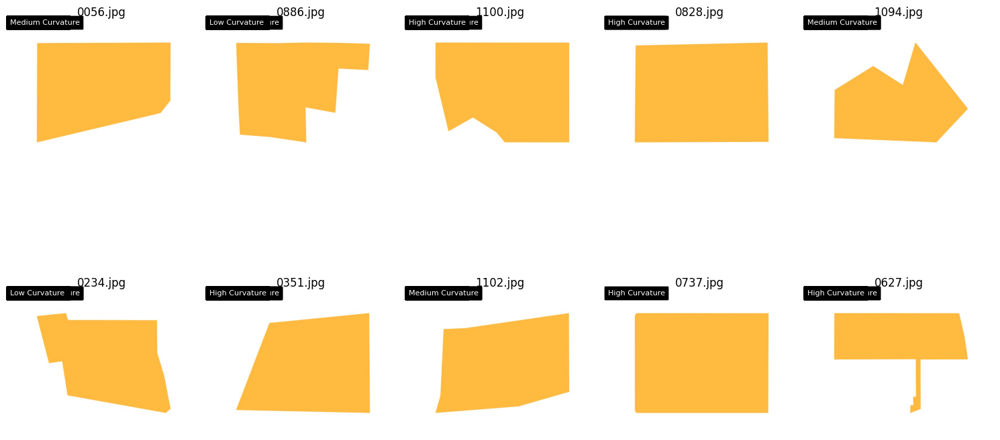

In [67]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

def extract_yellow_shapes(image):
    # Convert image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Define lower and upper bounds for yellow color
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    
    # Threshold the image to extract yellow regions
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    # Find contours of yellow regions
    contours, _ = cv2.findContours(yellow_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours

def compute_curvature(contour):
    # Check if contour has enough points
    if len(contour) < 5:
        return None
    
    # Calculate the first and second derivatives of x and y
    dx = np.gradient(contour[:, 0, 0])
    ddx = np.gradient(dx)
    dy = np.gradient(contour[:, 0, 1])
    ddy = np.gradient(dy)
    
    # Compute the curvature at each point
    curvature = (dx * ddy - dy * ddx) / ((dx ** 2 + dy ** 2) ** 1.5)
    
    return curvature

def classify_curvature(curvature):
    # Compute the mean curvature
    mean_curvature = np.mean(curvature)
    
    # Define criteria to classify curvature
    if mean_curvature < -0.1:
        curvature_class = "High Curvature"  # Highly curved shapes
    elif -0.1 <= mean_curvature < 0.1:
        curvature_class = "Medium Curvature"  # Moderately curved shapes
    else:
        curvature_class = "Low Curvature"  # Mostly straight or slightly curved shapes
    
    return curvature_class

# Path to the folder containing images
folder_path = "E7-images"

# List all image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Select 10 random image files
selected_image_files = random.sample(image_files, min(10, len(image_files)))

# Plot the images with annotations
plt.figure(figsize=(15, 10))
for i, image_file in enumerate(selected_image_files):
    # Read the image
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)
    
    # Display the image using Matplotlib
    plt.subplot(2, 5, i + 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(image_file)
    plt.axis('off')
    
    # Extract yellow shapes from the image
    yellow_shapes = extract_yellow_shapes(image)
    
    # Perform curvature classification for each shape
    for contour in yellow_shapes:
        curvature = compute_curvature(contour)
        if curvature is not None:
            curvature_class = classify_curvature(curvature)
            
            # Print the curvature class for each shape
            plt.text(10, 10, curvature_class, color='white', backgroundcolor='black', fontsize=8)
    
plt.tight_layout()
plt.show()


## **Question 1 - classifiy**

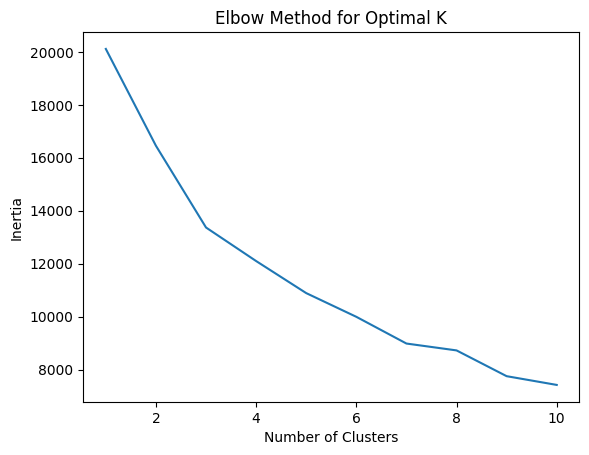

Optimal parameters: eps=0.1, min_samples=1


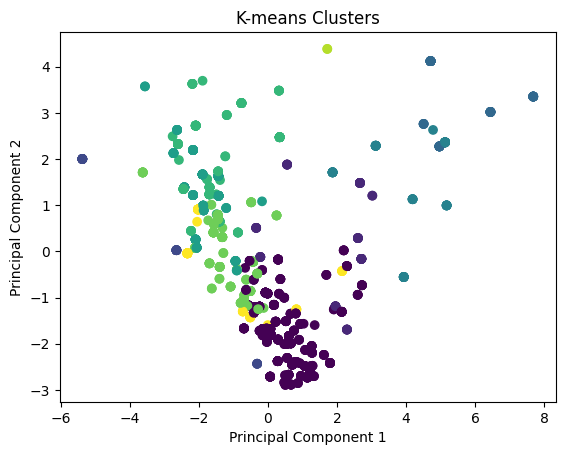

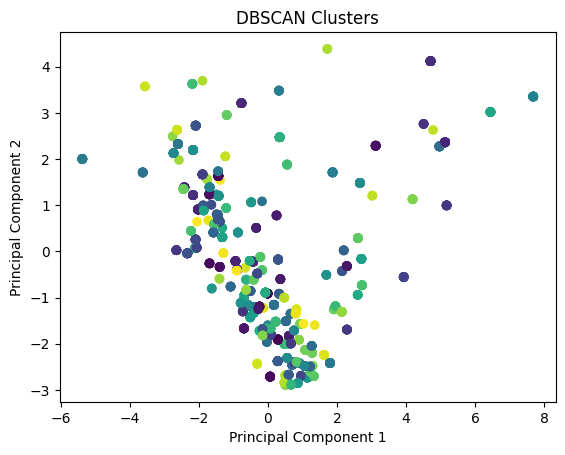

In [78]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Function to extract features from images
def extract_features(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize the image to a fixed size if needed
    # image_resized = cv2.resize(gray, (width, height))

    # Apply Gaussian blur to reduce noise if needed
    # blurred = cv2.GaussianBlur(image_resized, (5, 5), 0)

    # Compute color histogram features
    hist = cv2.calcHist([image], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = hist.flatten()

    # Compute texture features using GLCM (Grey-Level Co-occurrence Matrix) if needed
    # glcm = greycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    # texture_features = np.array([greycoprops(glcm, prop).ravel()[0] for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']])

    # Combine all features into a single feature vector
    features = hist  # Concatenate other features if needed

    return features

# Path to the folder containing images
folder_path = "E7-images"

# List all image files in the folder
image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Extract features from images
features_list = []
for image_file in image_files:
    features = extract_features(image_file)
    features_list.append(features)

# Convert feature list to numpy array
X = np.array(features_list)

# Normalize features
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Apply dimensionality reduction (optional)
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X_normalized)

# Determine number of clusters using the elbow method for K-means
# Note: Uncomment this section if you want to use K-means
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X_normalized)
    inertia.append(kmeans.inertia_)
plt.plot(range(1, 11), inertia)
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

# Determine number of clusters using the elbow method for DBSCAN
# Note: Uncomment this section if you want to use DBSCAN
eps_values = np.linspace(0.1, 2.0, num=20)
min_samples_values = range(1, 11)
silhouette_scores = []
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(X_normalized)
        if len(np.unique(dbscan.labels_)) > 1:  # Ensure at least 2 clusters are formed
            silhouette_scores.append((eps, min_samples, np.mean(silhouette_score(X_normalized, dbscan.labels_))))
eps, min_samples, _ = max(silhouette_scores, key=lambda x: x[2])
print(f"Optimal parameters: eps={eps}, min_samples={min_samples}")

# Based on the optimal parameters obtained above, apply clustering
kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
kmeans.fit(X_normalized)
labels_kmeans = kmeans.labels_

dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(X_normalized)
labels_dbscan = dbscan.labels_

# Visualize the clusters (optional)
# Note: Uncomment this section if you want to visualize the clusters
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=labels_kmeans, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clusters')
plt.show()

plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=labels_dbscan, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clusters')
plt.show()


c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\

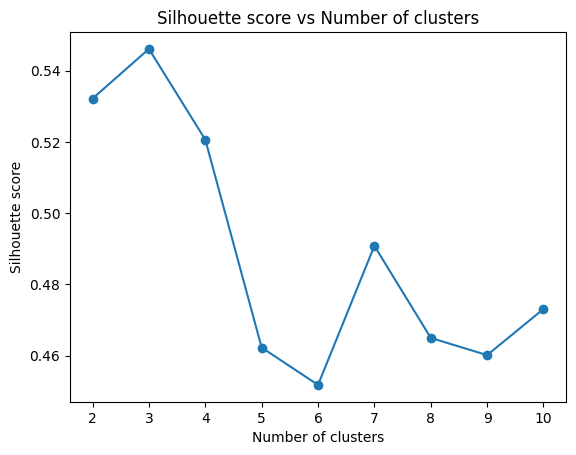

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [84]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def extract_features(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize the image to a fixed size if needed
    # image_resized = cv2.resize(gray, (width, height))

    # Apply Gaussian blur to reduce noise if needed
    # blurred = cv2.GaussianBlur(image_resized, (5, 5), 0)

    # Compute color histogram features
    hist = cv2.calcHist([image], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = hist.flatten()

    # Compute texture features using GLCM (Grey-Level Co-occurrence Matrix) if needed
    # glcm = greycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    # texture_features = np.array([greycoprops(glcm, prop).ravel()[0] for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']])

    # Combine all features into a single feature vector
    features = hist  # Concatenate other features if needed

    return features


# Path to the folder containing images
folder_path = "E7-images"

# Extract features from all images
features_list = []
for filename in os.listdir(folder_path):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(folder_path, filename)
        features = extract_features(image_path)
        features_list.append(features)

# Standardize the features
scaler = StandardScaler()
features_std = scaler.fit_transform(features_list)

# Dimensionality reduction (optional)
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_std)

# Determine the optimal number of clusters
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(features_pca)
    silhouette_avg = silhouette_score(features_pca, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette scores
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette score vs Number of clusters')
plt.show()

# Choose the optimal number of clusters based on the plot and train the final model
optimal_n_clusters = np.argmax(silhouette_scores) + 2  # Add 2 because range starts from 2
final_kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=42)
final_cluster_labels = final_kmeans.fit_predict(features_std)

# Visualize the clustering results (if applicable)
# Plot the clustered images or any other visualization based on your feature space

# Optionally, save the clustering results to a file or database for further analysis


c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


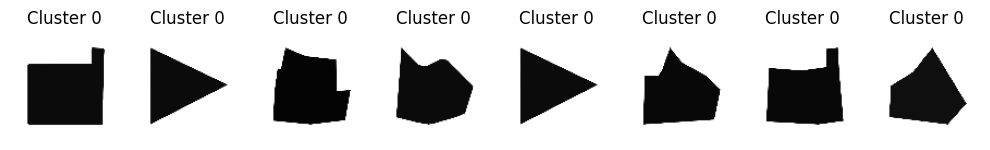

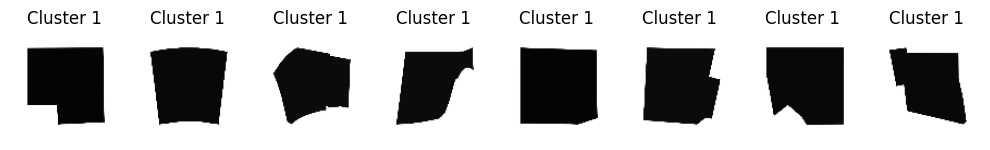

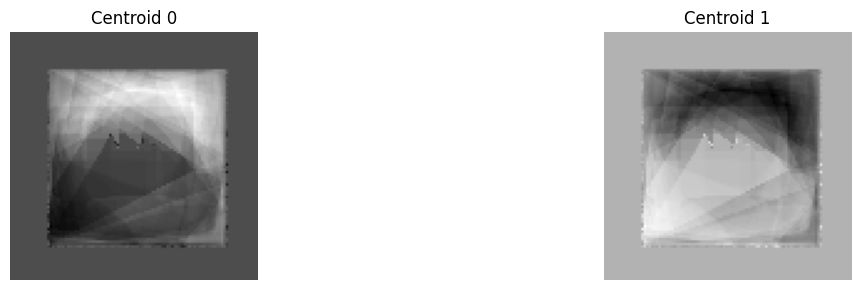

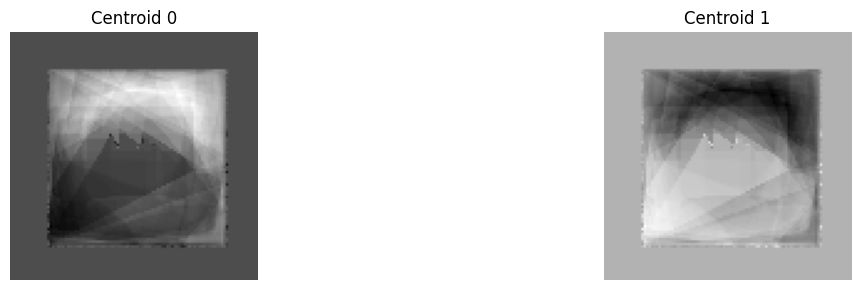

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


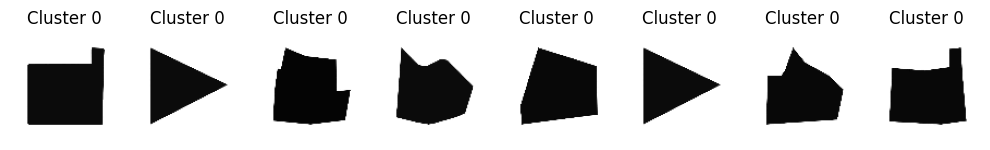

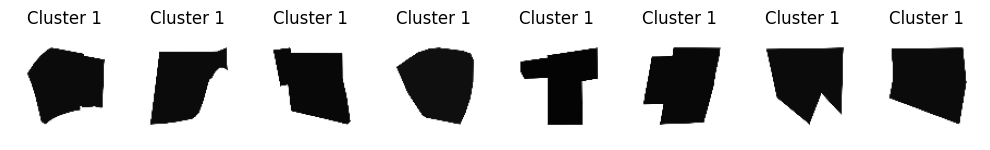

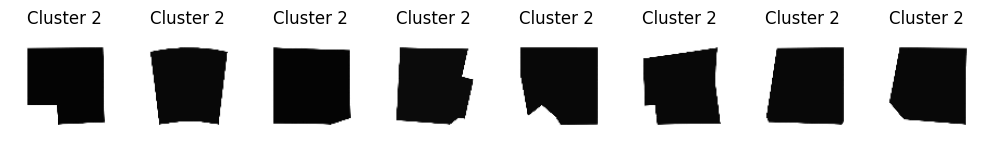

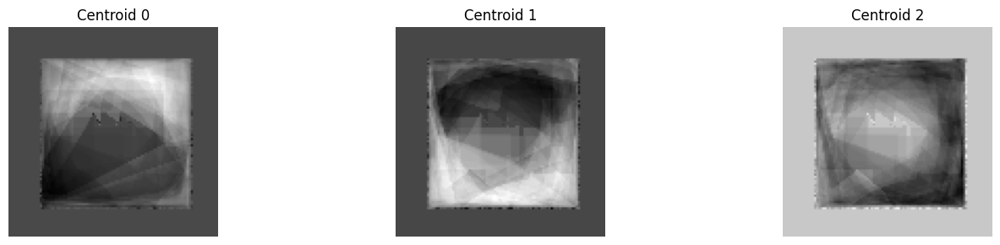

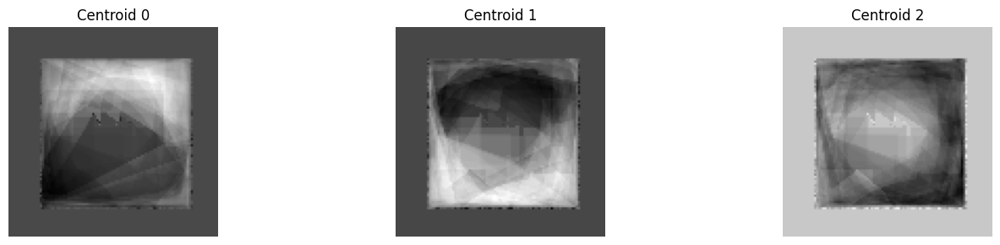

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


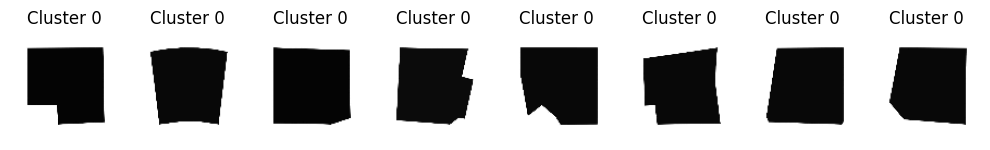

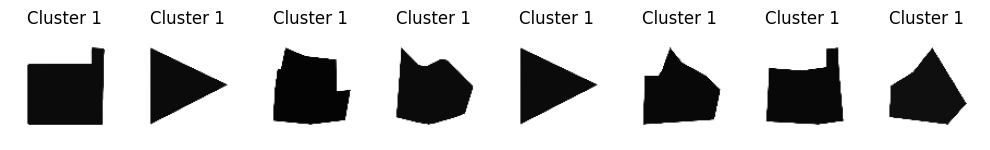

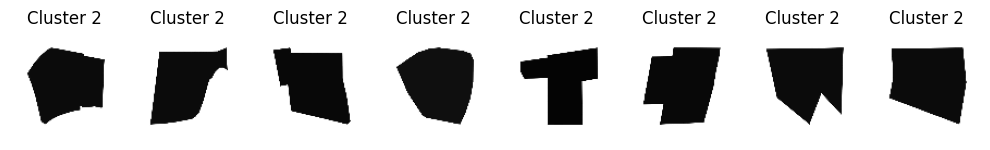

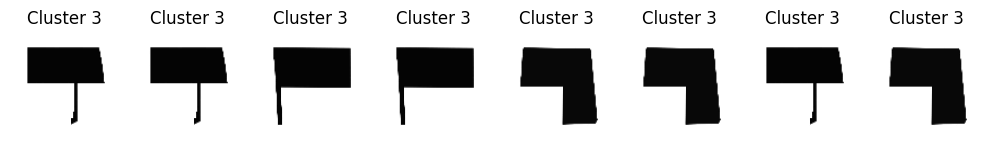

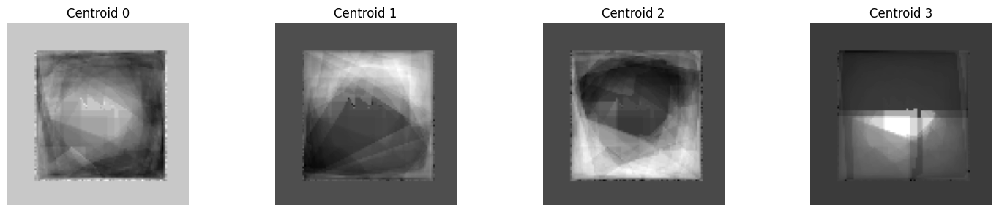

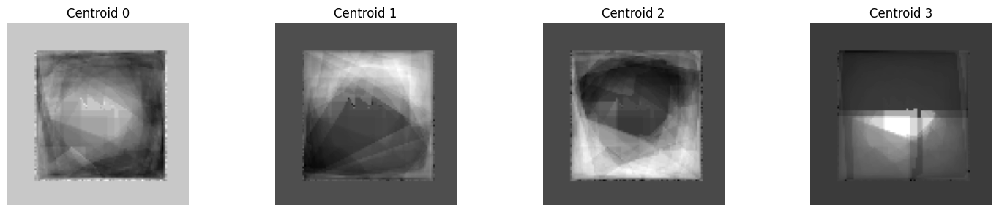

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


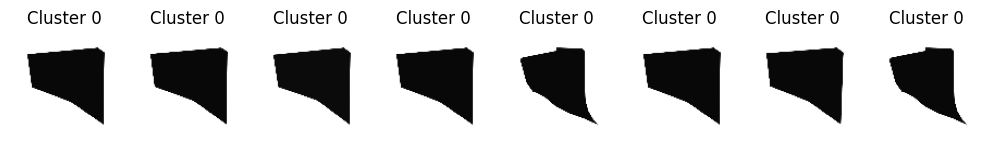

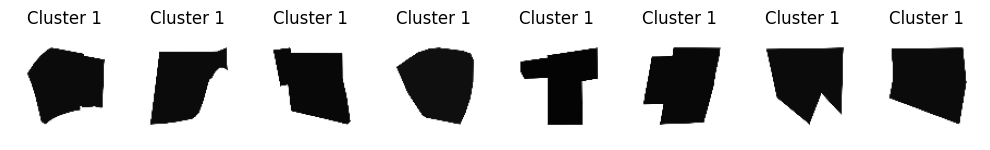

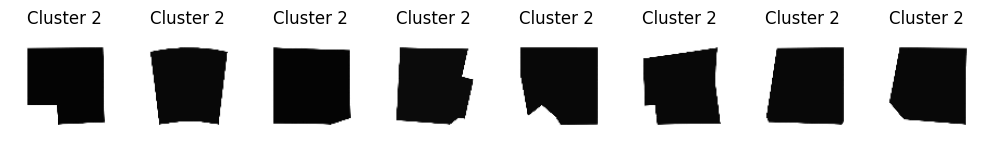

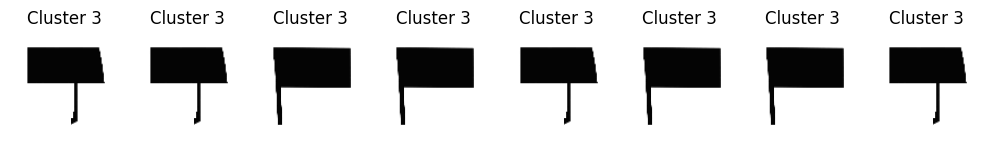

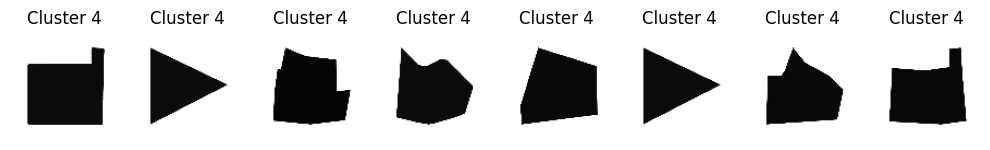

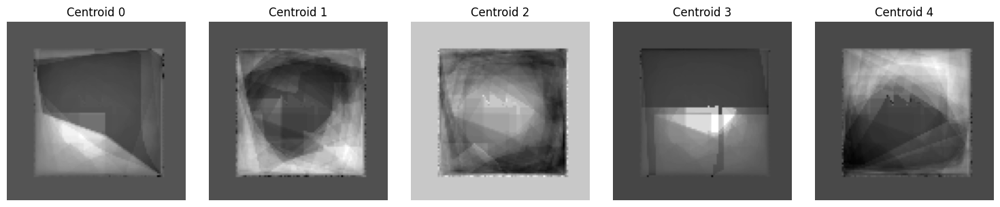

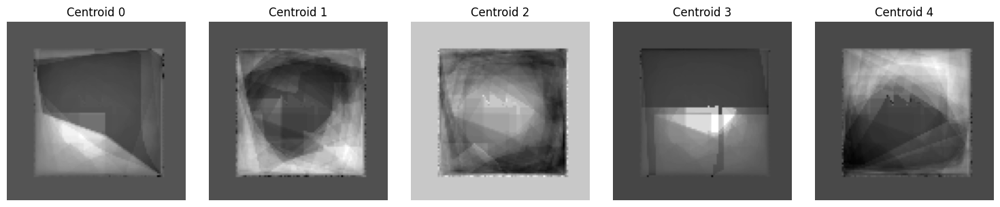

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


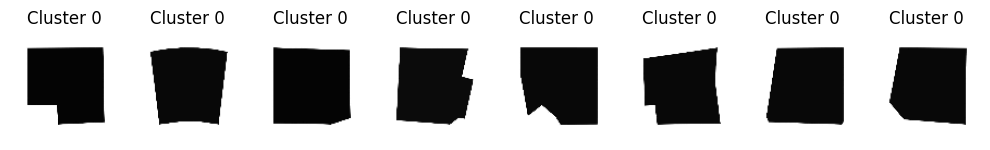

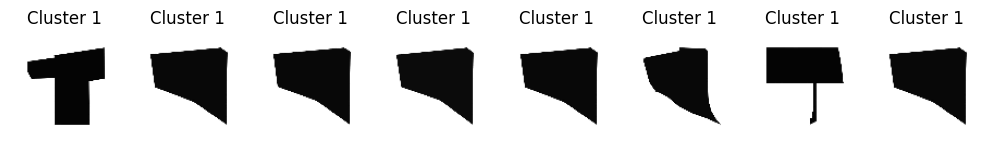

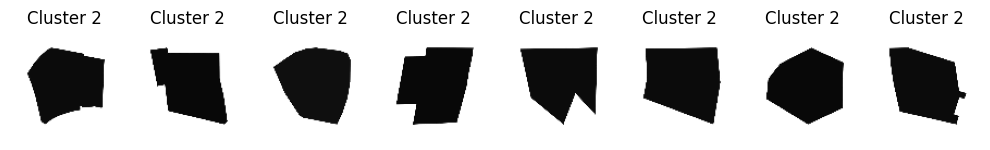

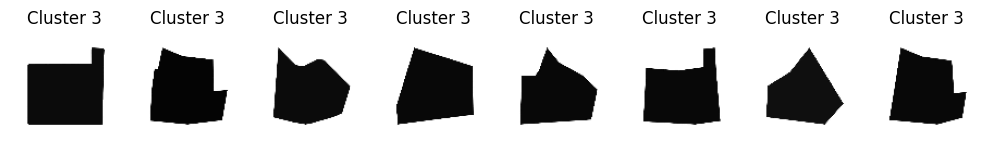

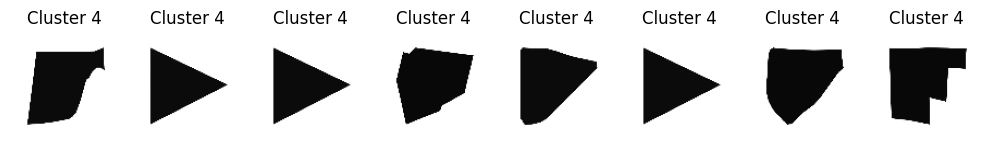

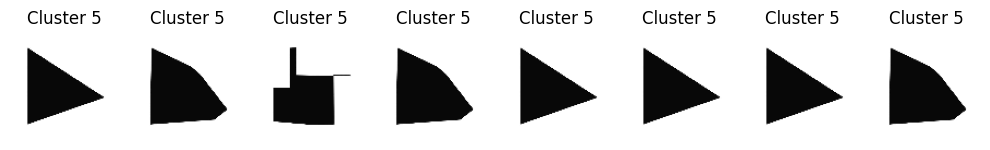

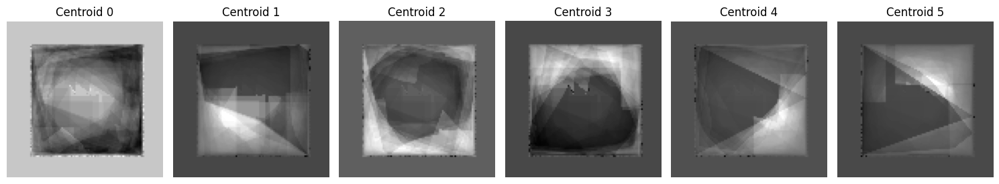

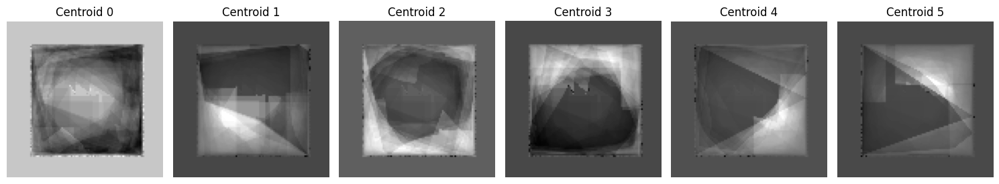

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


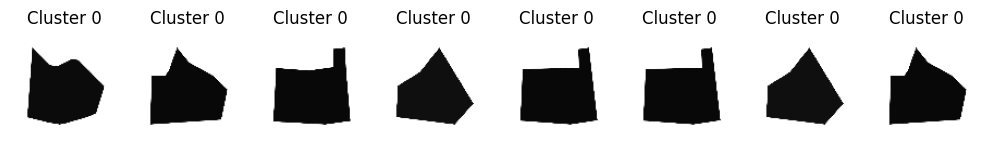

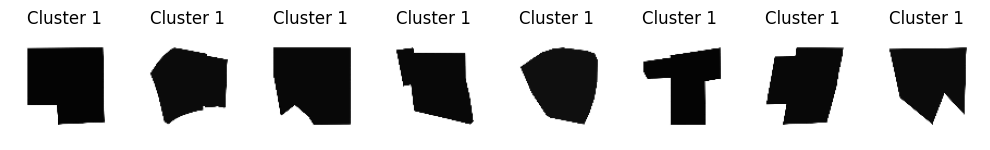

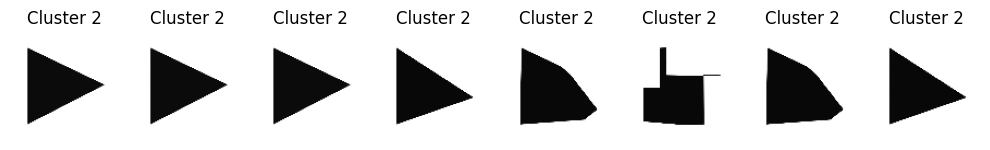

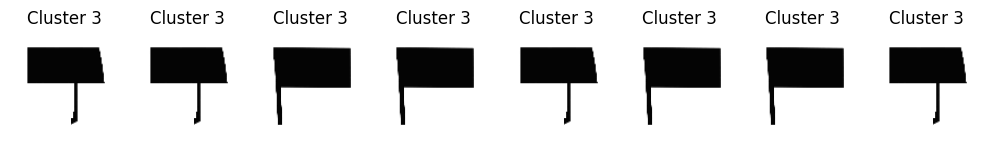

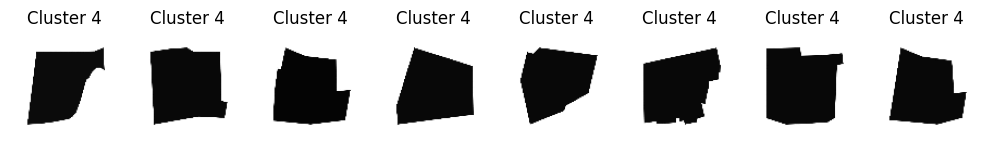

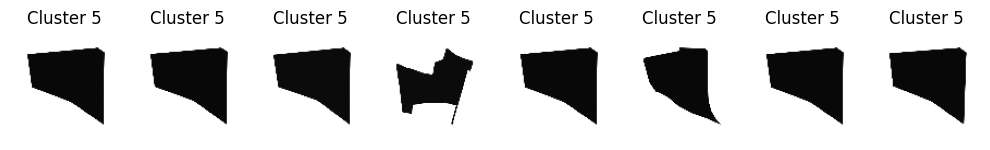

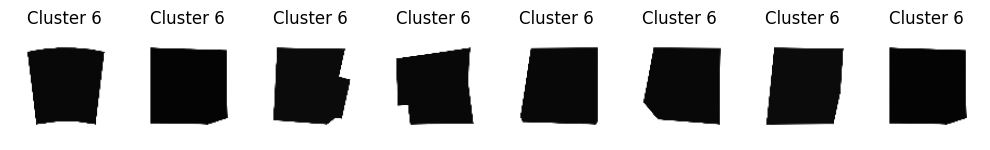

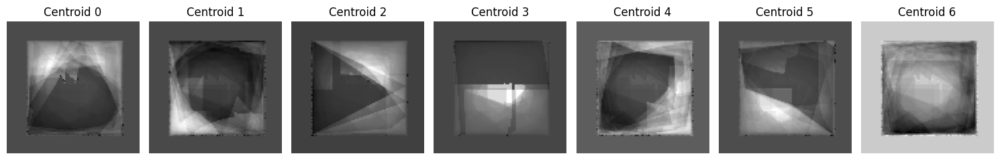

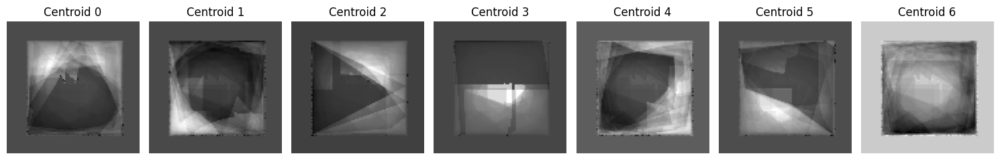

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


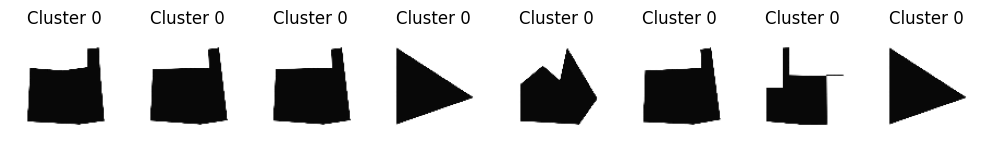

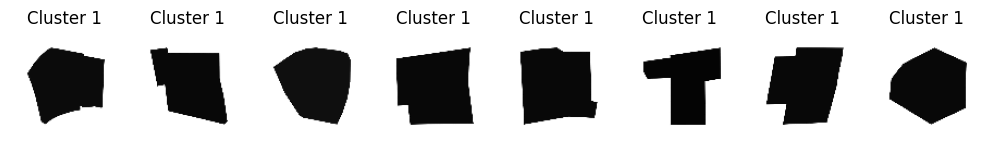

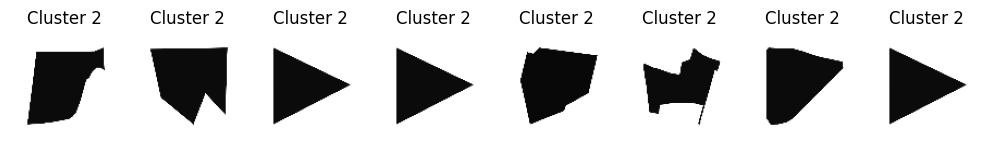

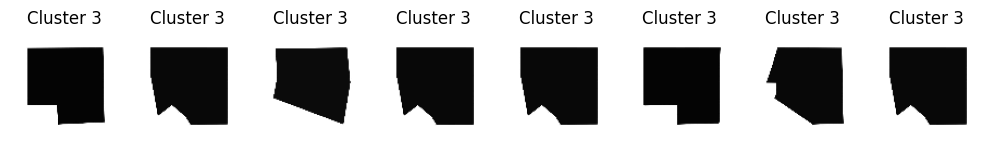

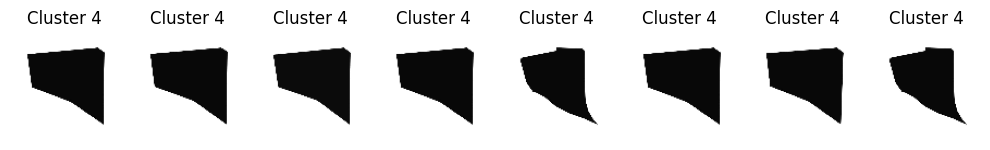

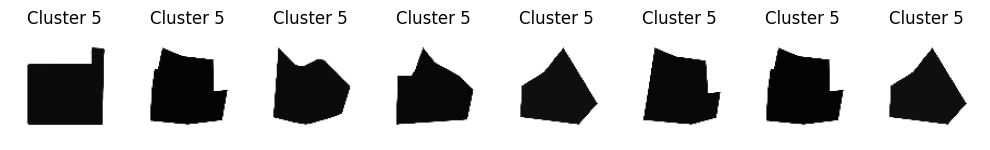

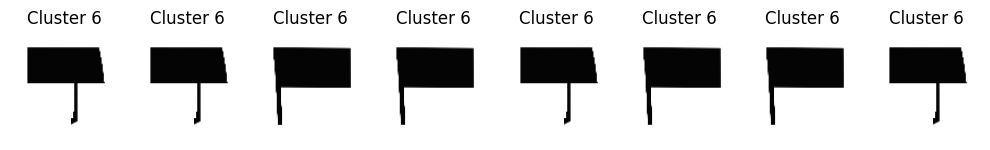

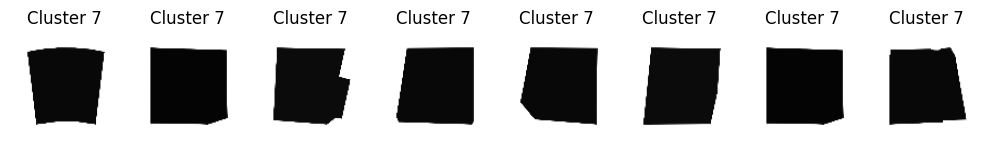

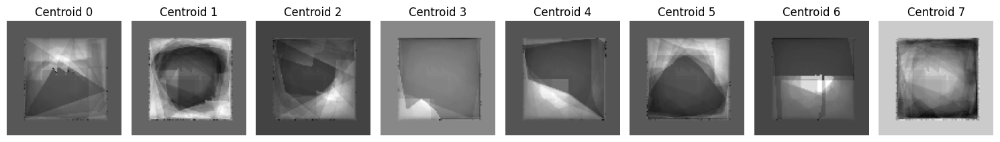

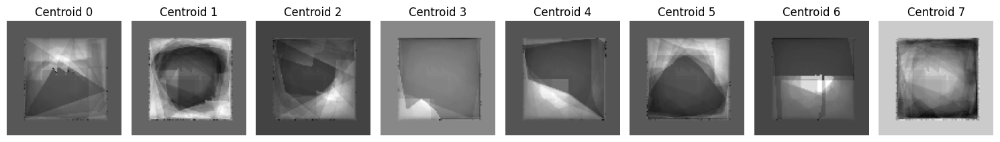

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


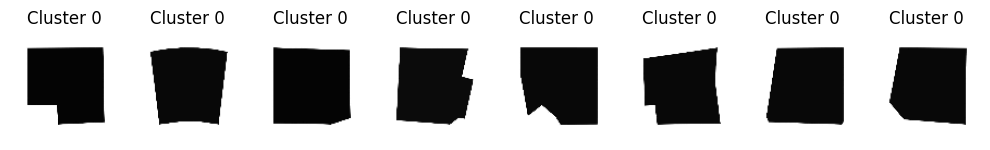

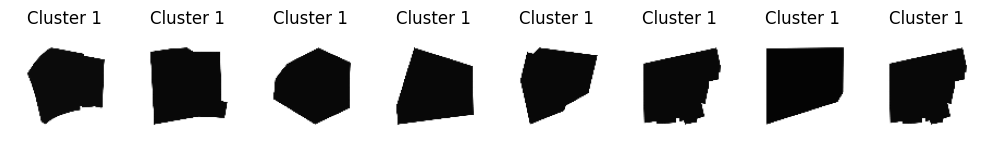

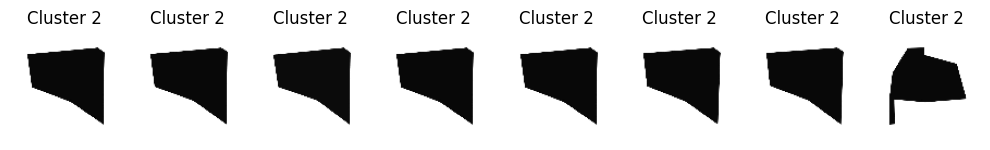

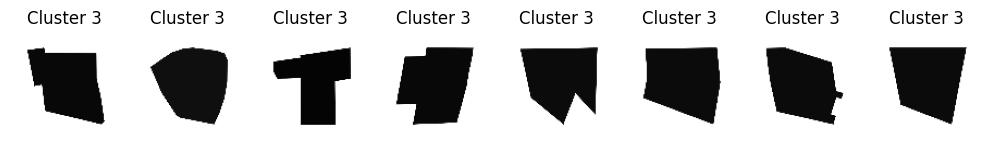

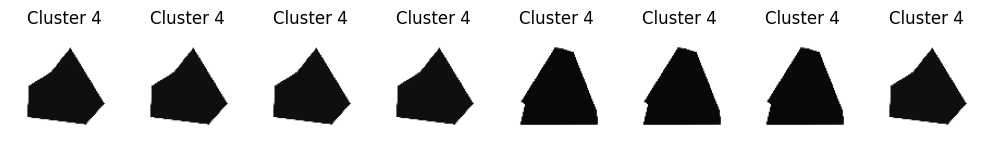

...

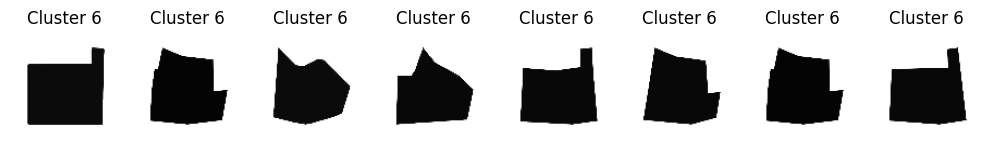

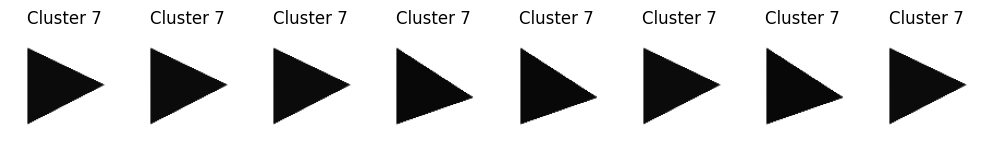

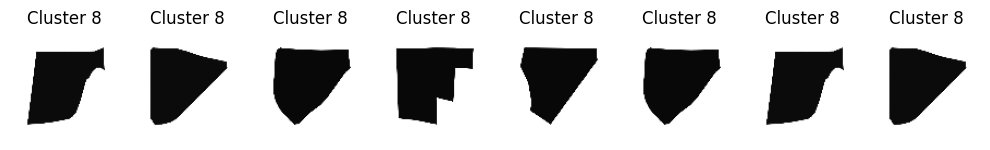

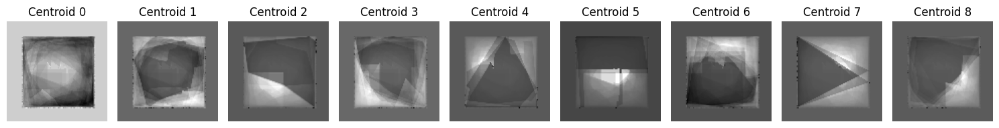

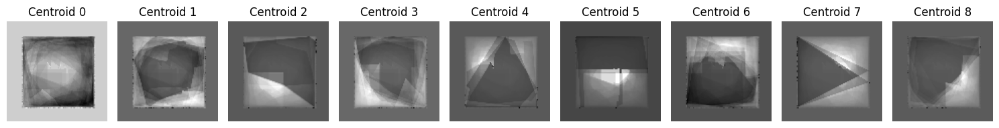

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


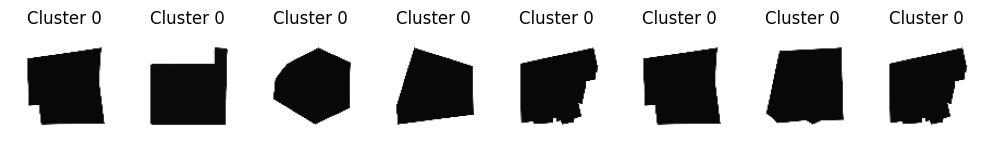

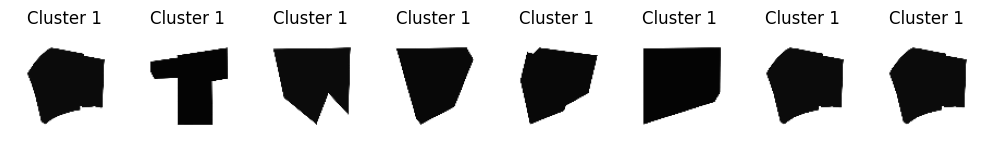

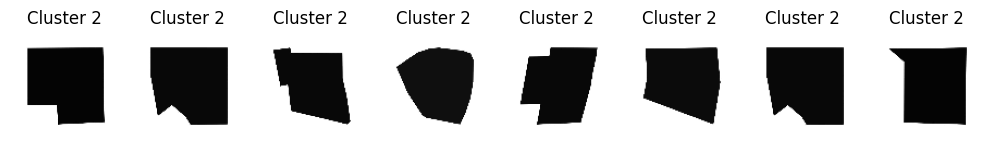

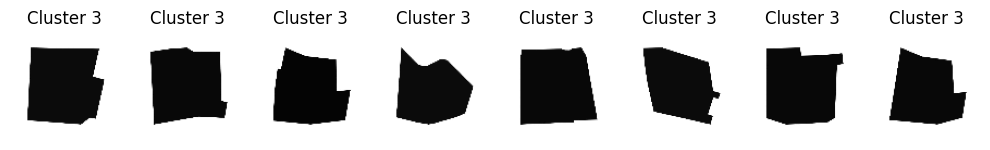

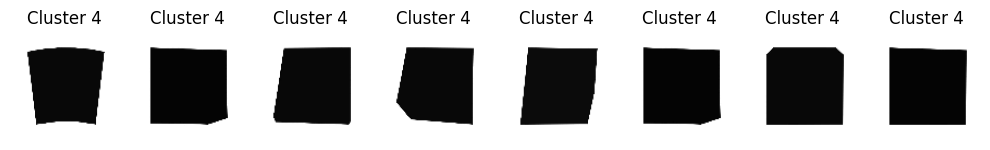

...

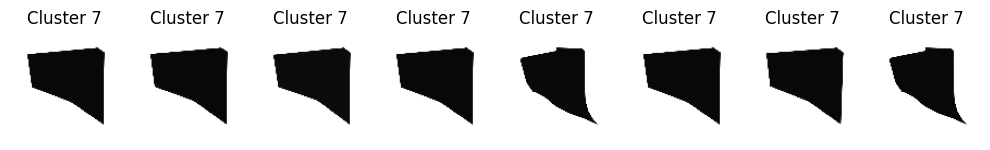

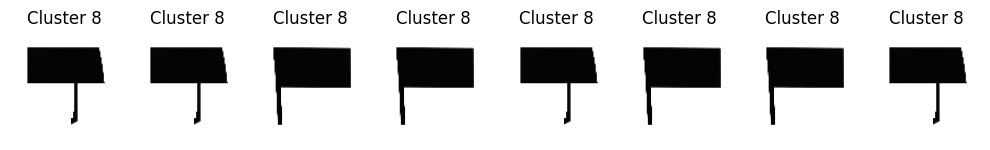

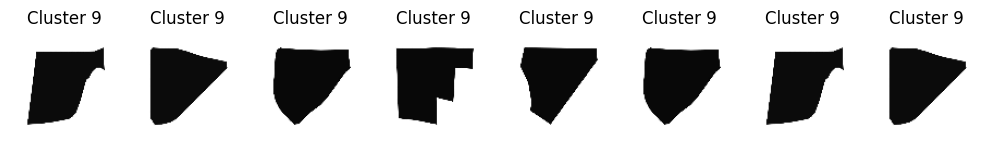

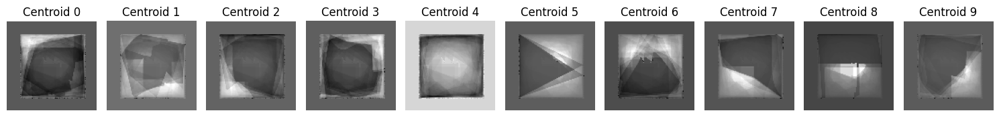

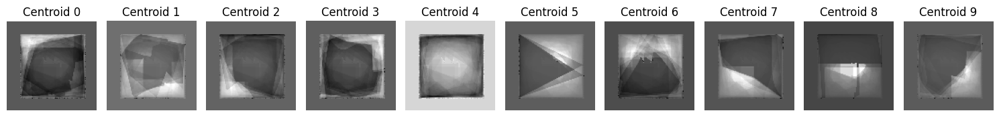

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


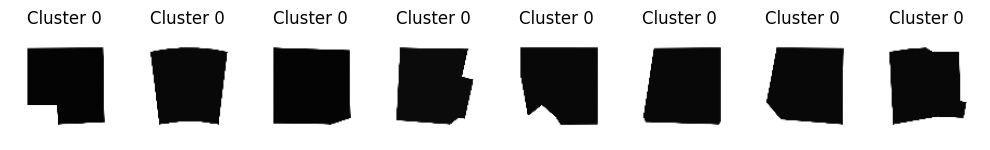

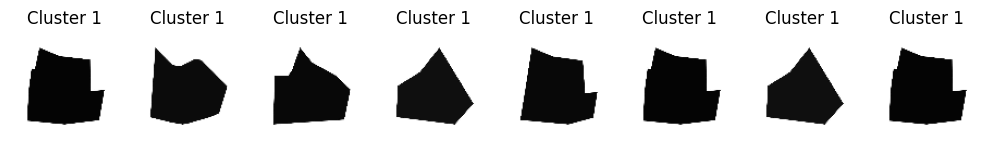

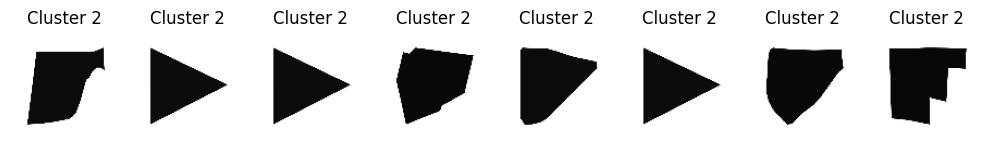

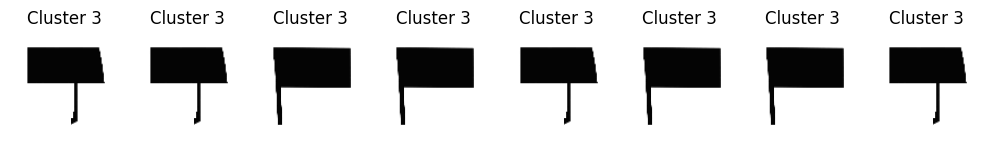

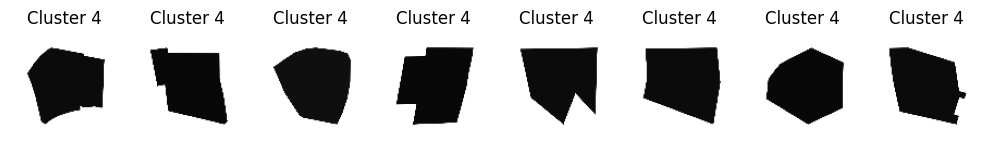

...

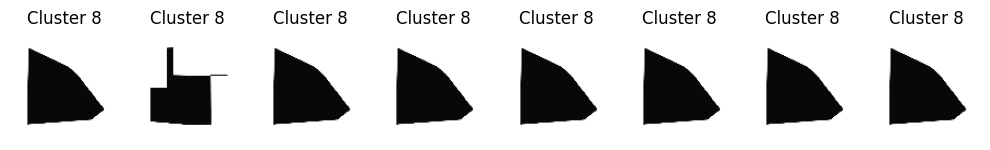

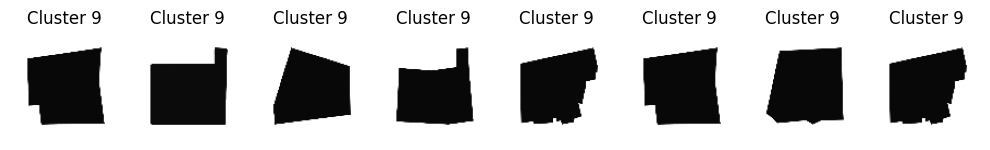

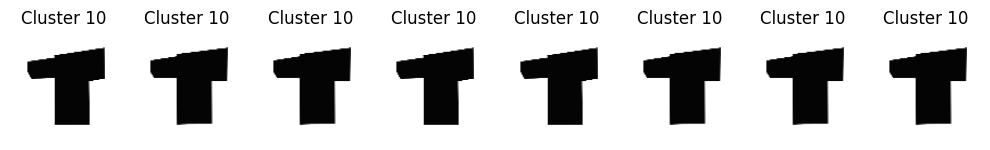

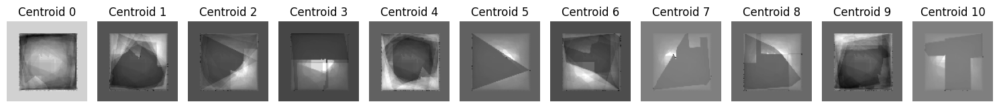

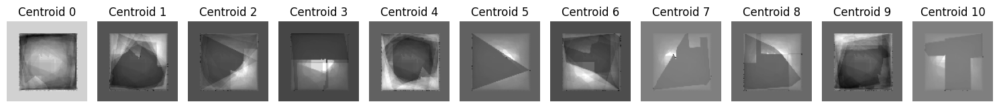

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


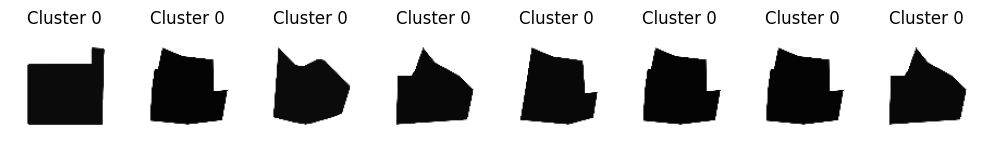

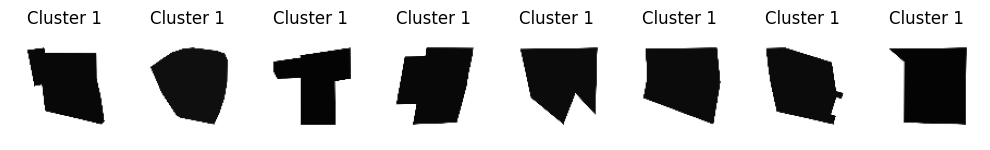

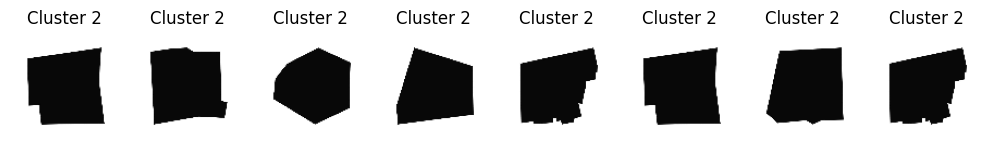

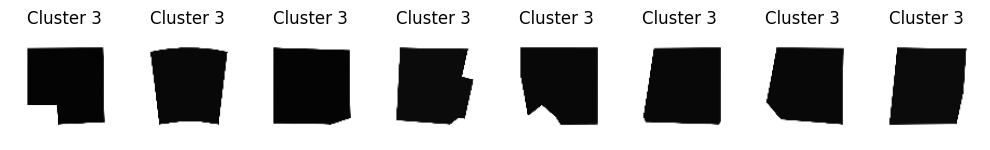

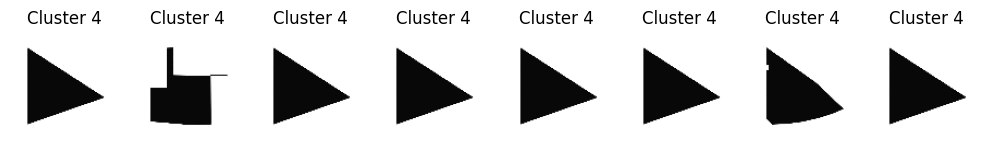

...

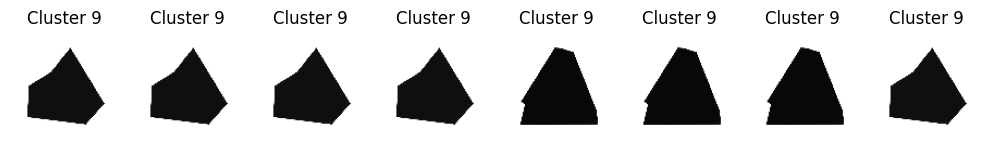

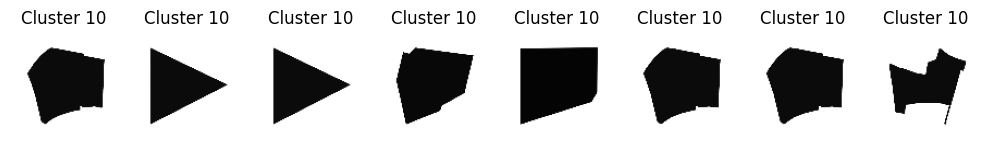

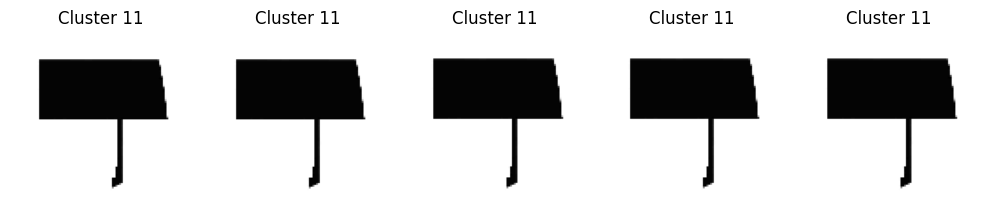

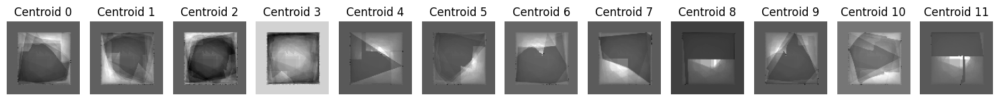

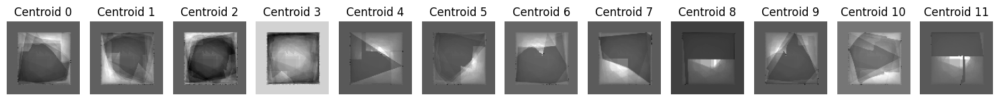

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


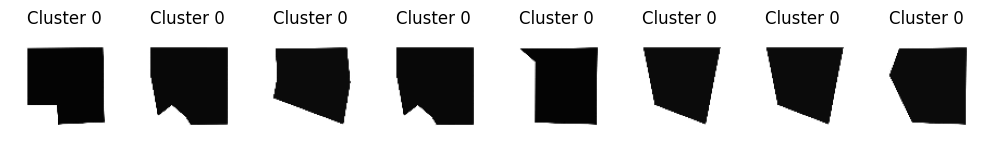

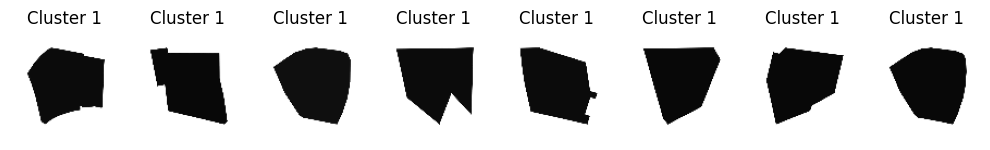

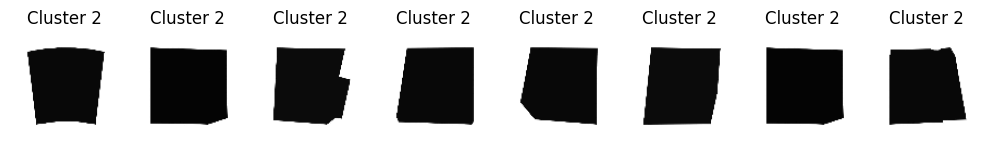

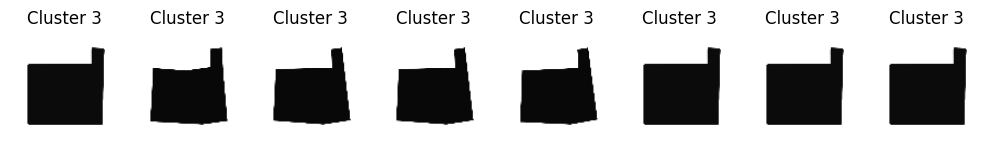

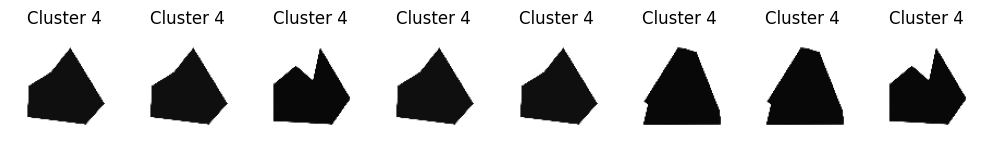

...

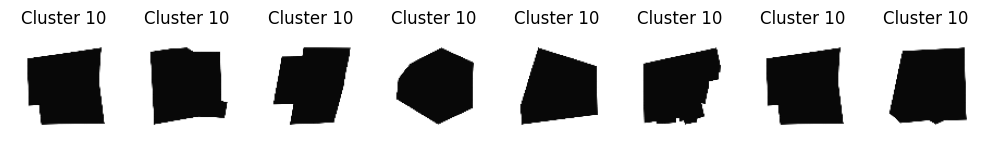

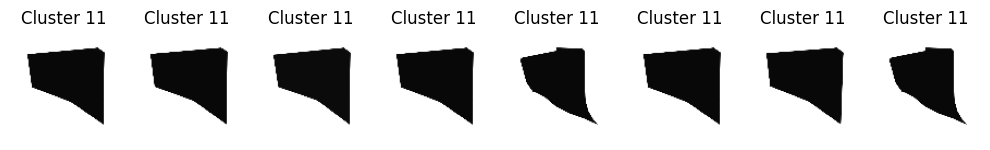

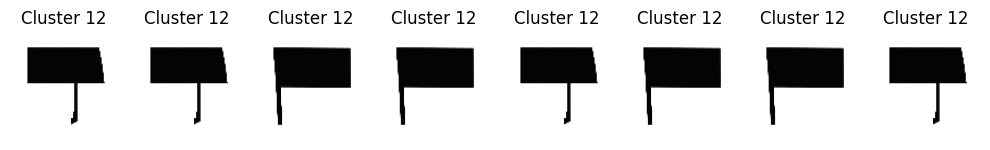

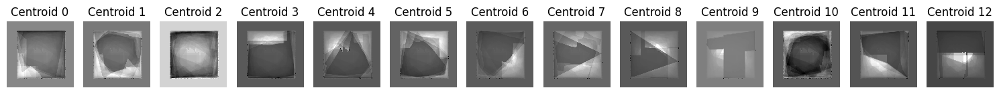

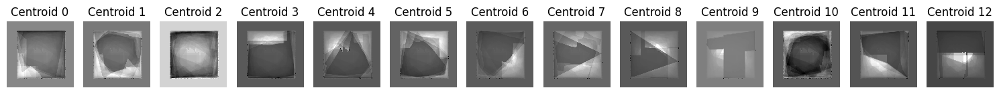

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


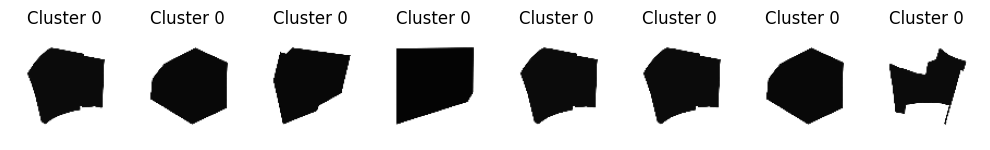

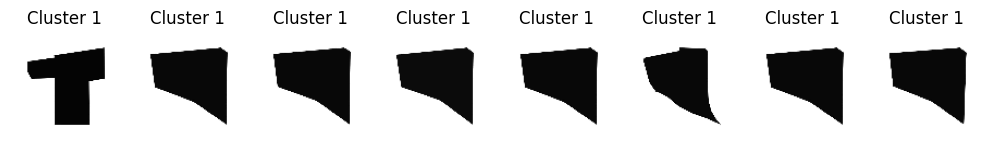

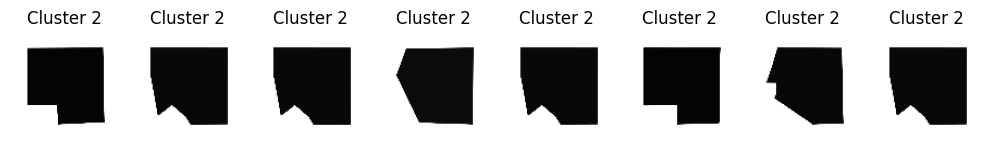

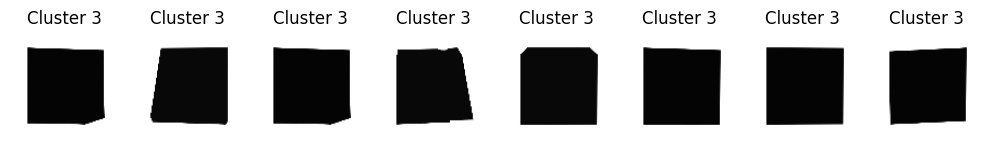

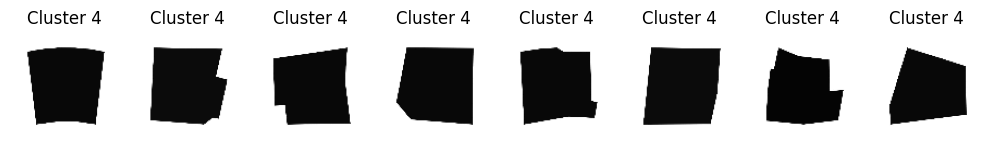

...

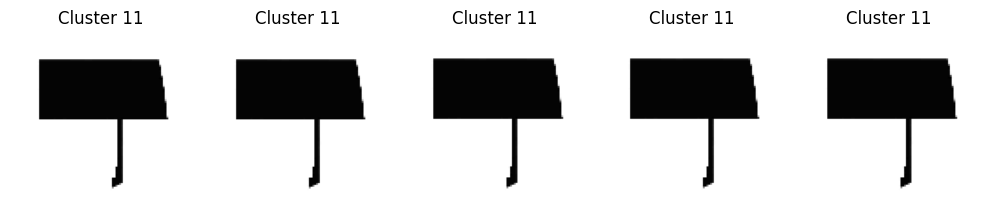

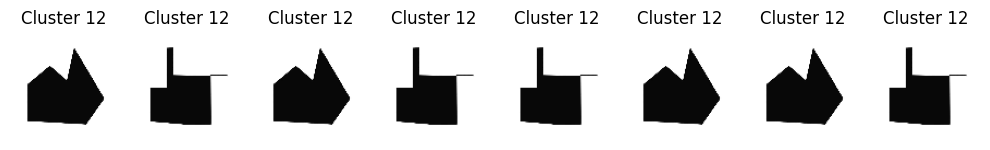

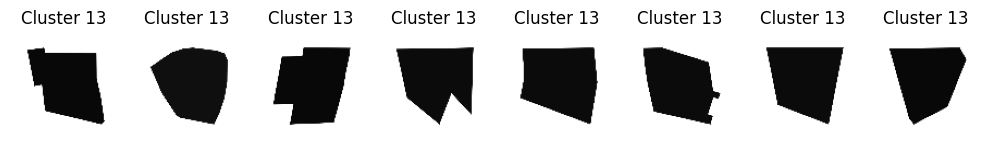

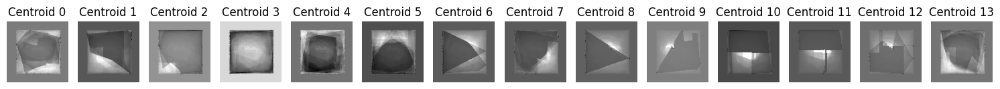

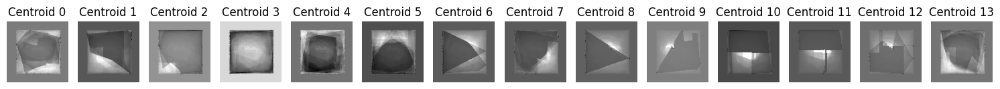

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


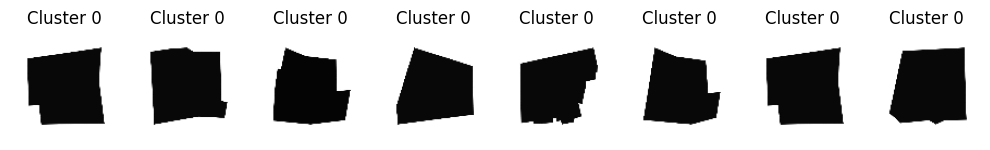

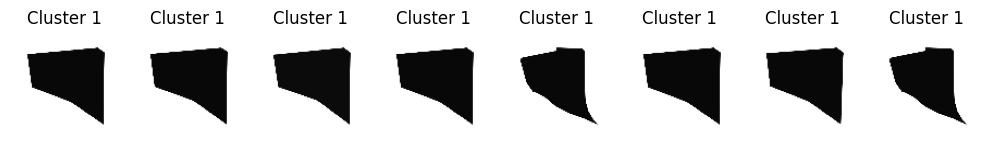

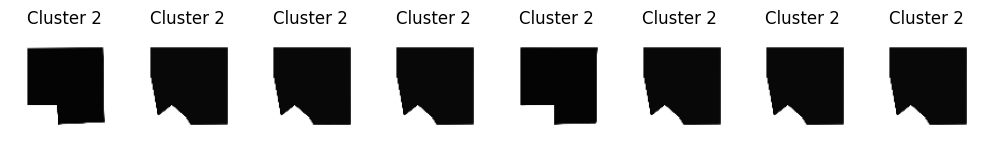

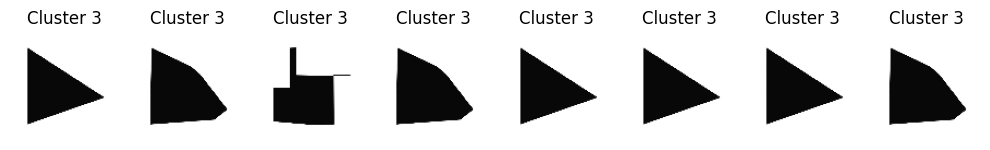

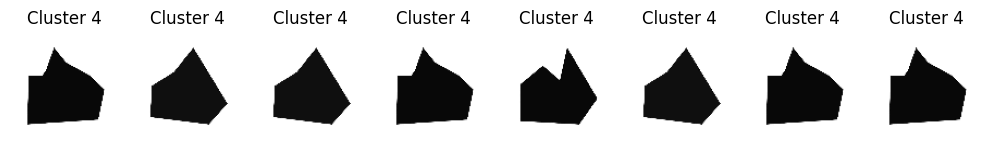

...

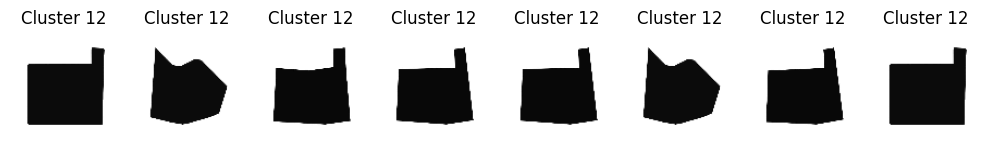

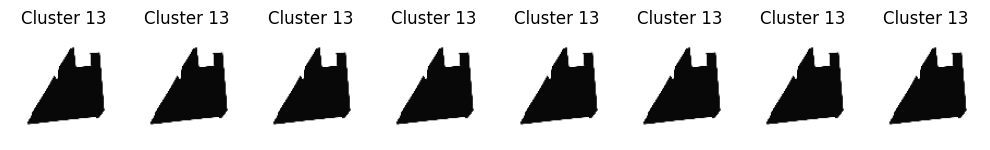

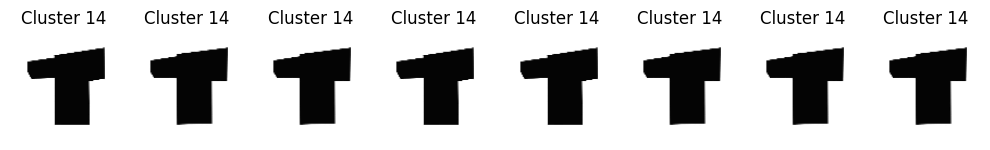

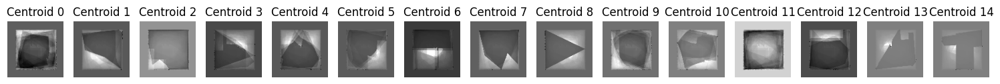

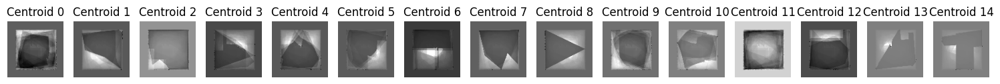

In [4]:

import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract features from images
def extract_features(images_folder):
    features = []
    for filename in os.listdir(images_folder):
        img = cv2.imread(os.path.join(images_folder, filename), cv2.IMREAD_GRAYSCALE)
        resized_img = cv2.resize(img, (100, 100)).flatten()
        features.append(resized_img)
    return np.array(features)

# Load images and extract features
images_folder = "E7-images"
features = extract_features(images_folder)

# Standardize features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Apply KMeans clustering
for k in range(2,16 ):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(scaled_features)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_

    # Visualize clustered images
    for cluster_id in range(k):
        cluster_images = features[labels == cluster_id]
        num_images_to_display = min(len(cluster_images), 8)  # Display up to 3 images per cluster
        fig, axs = plt.subplots(1, num_images_to_display, figsize=(10, 3))
        for i, image in enumerate(cluster_images[:num_images_to_display]):
            axs[i].imshow(image.reshape(100, 100), cmap='gray')
            axs[i].set_title(f'Cluster {cluster_id}')
            axs[i].axis('off')
        plt.tight_layout()
        plt.show()

    # Visualize centroids
    fig, axs = plt.subplots(1, k, figsize=(15, 3))
    for i in range(k):
        centroid_img = centroids[i].reshape(100, 100)
        axs[i].imshow(centroid_img, cmap='gray')
        axs[i].set_title(f'Centroid {i}')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

    # Visualize centroids
    fig, axs = plt.subplots(1, k, figsize=(15, 3))
    for i in range(k):
        centroid_img = centroids[i].reshape(100, 100)
        axs[i].imshow(centroid_img, cmap='gray')
        axs[i].set_title(f'Centroid {i}')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

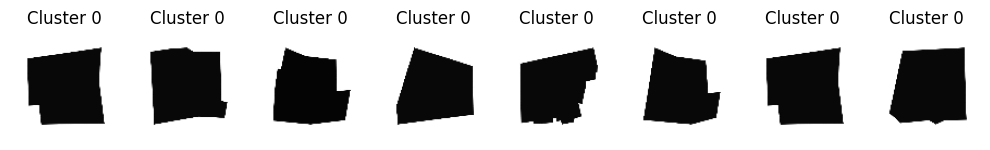

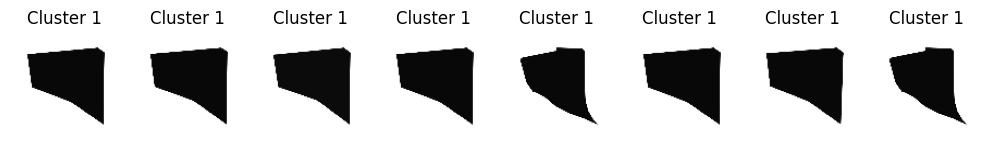

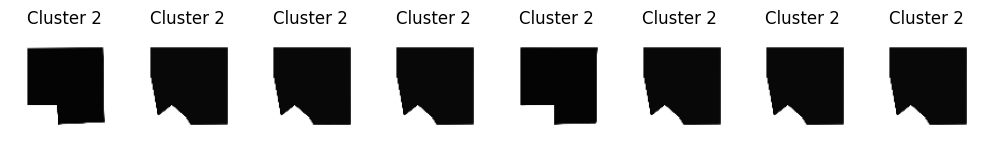

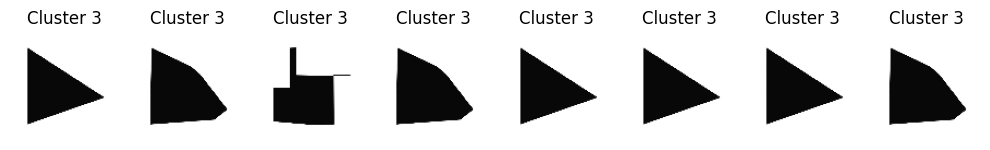

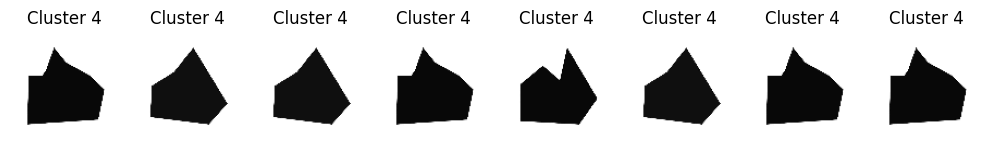

...

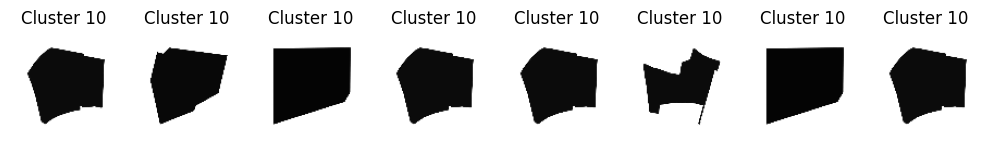

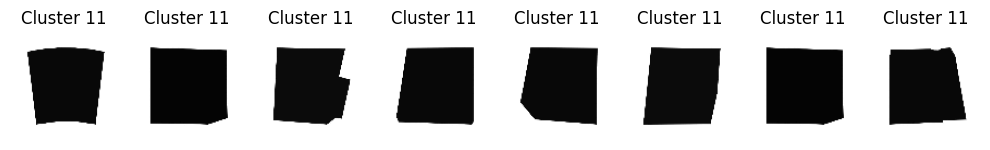

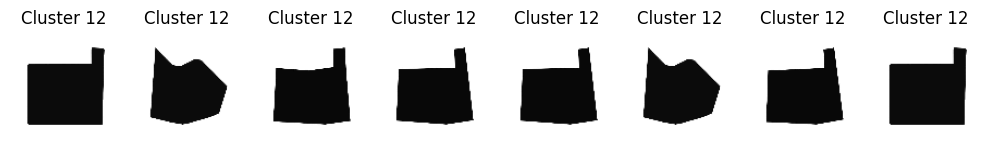

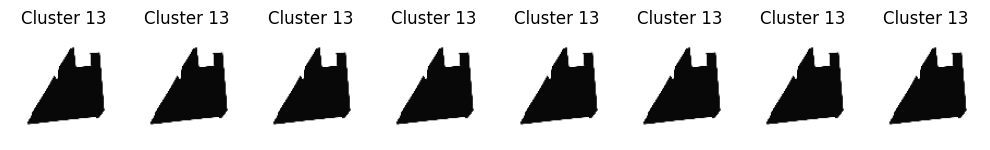

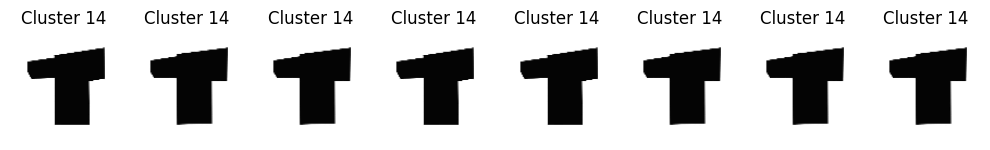

In [5]:
# Visualize clustered images
for cluster_id in range(k):
    cluster_images = features[labels == cluster_id]
    num_images_to_display = min(len(cluster_images), 8)  # Display up to 8 images per cluster
    fig, axs = plt.subplots(1, num_images_to_display, figsize=(10, 3))
    for i, image in enumerate(cluster_images[:num_images_to_display]):
        axs[i].imshow(image.reshape(100, 100), cmap='gray')
        axs[i].set_title(f'Cluster {cluster_id}')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()


c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\

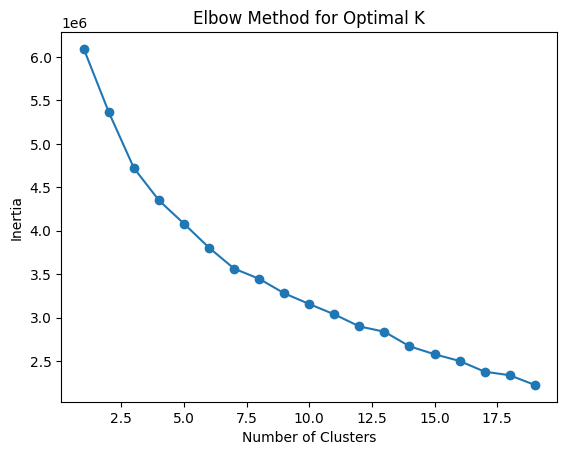

In [6]:
# Plotting number of clusters vs. inertia
inertias = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(scaled_features)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 20), inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\

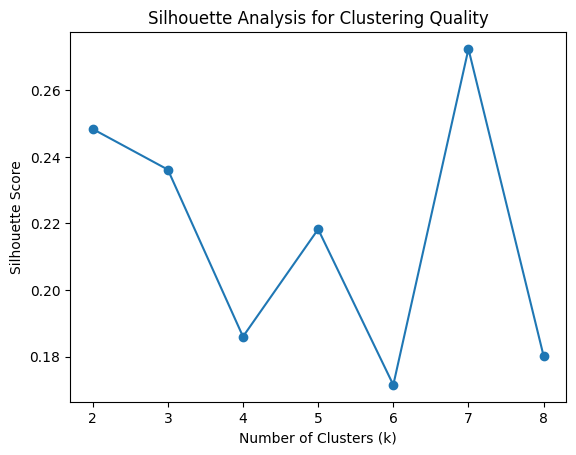

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 9):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(scaled_features)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(scaled_features, labels))

plt.plot(range(2, 9), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for Clustering Quality')
plt.show()

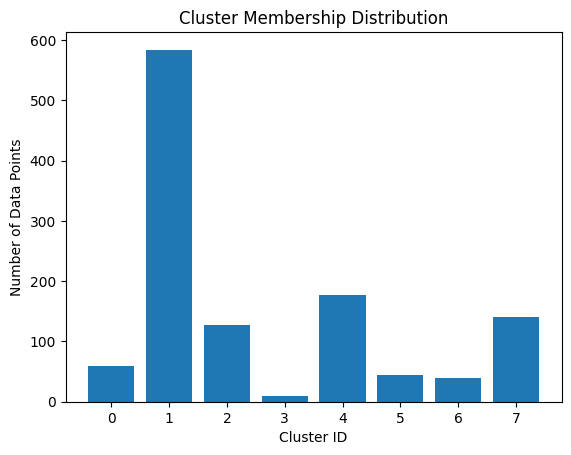

In [ ]:
plt.hist(labels, bins=np.arange(k+1)-0.5, rwidth=0.8, align='mid')
plt.xlabel('Cluster ID')
plt.ylabel('Number of Data Points')
plt.title('Cluster Membership Distribution')
plt.xticks(range(k))
plt.show()

c:\Users\91797\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


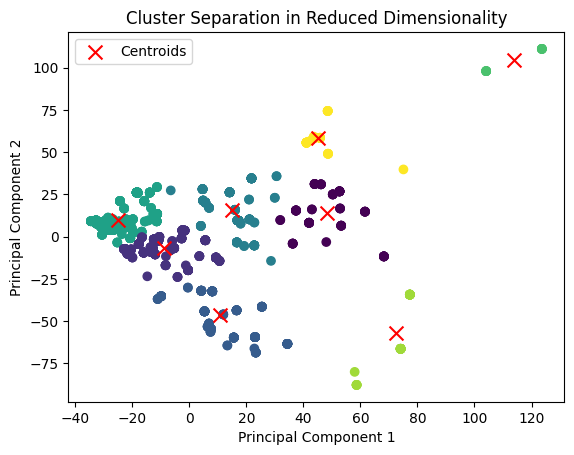

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reduced_features = pca.fit_transform(scaled_features)
kmeans = KMeans(n_clusters=k)
kmeans.fit(reduced_features)
labels = kmeans.labels_

plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=100, c='red', label='Centroids')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Cluster Separation in Reduced Dimensionality')
plt.legend()
plt.show()

Number of clusters found: 66


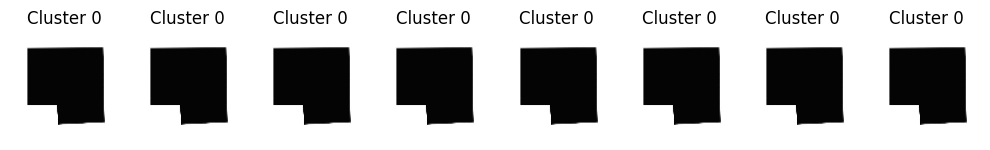

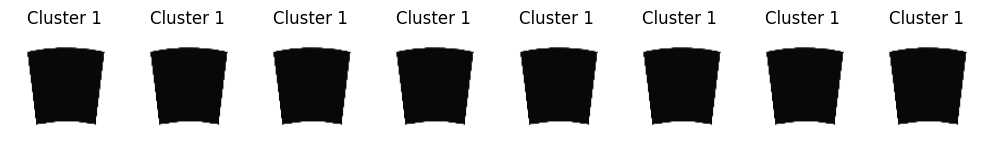

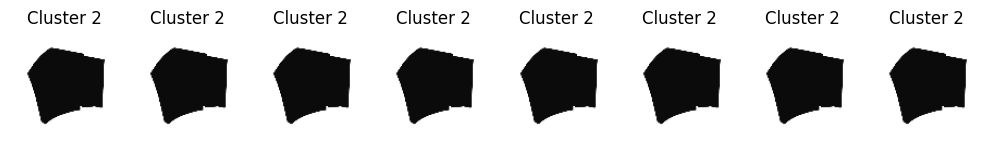

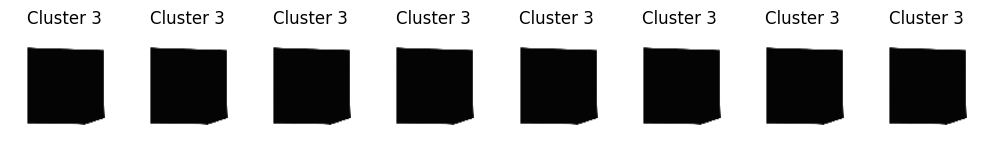

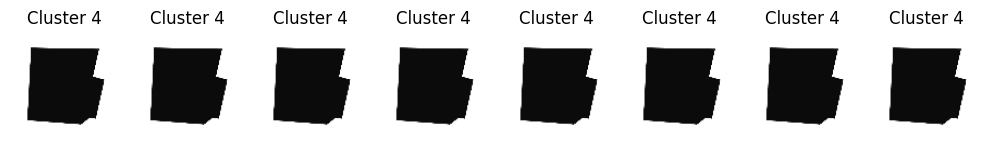

...

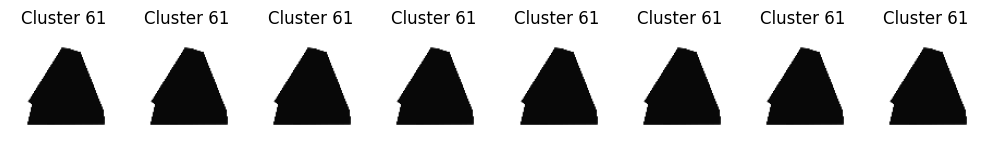

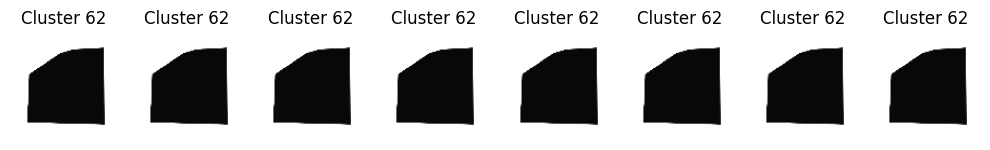

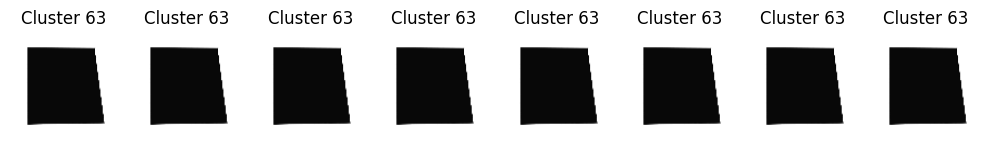

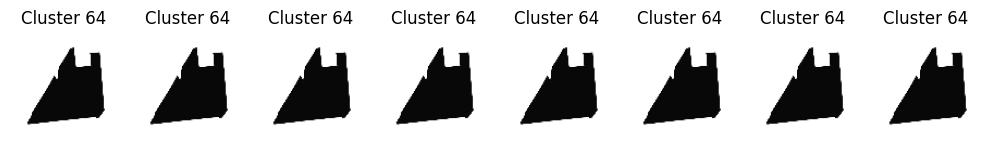

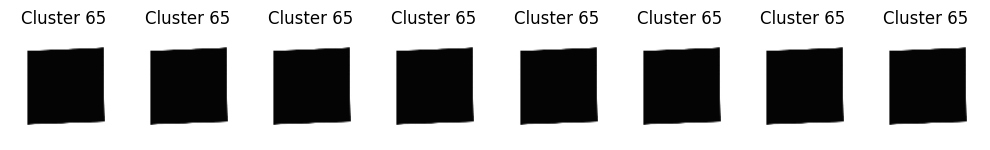

In [ ]:
import os
import cv2
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract features from images
def extract_features(images_folder):
    features = []
    for filename in os.listdir(images_folder):
        img = cv2.imread(os.path.join(images_folder, filename), cv2.IMREAD_GRAYSCALE)
        resized_img = cv2.resize(img, (100, 100)).flatten()
        features.append(resized_img)
    return np.array(features)

# Load images and extract features
images_folder = "E7-images"
features = extract_features(images_folder)

# Standardize features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=8)
labels = dbscan.fit_predict(scaled_features)

# Number of clusters in labels, ignoring noise if present (-1 label)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Number of clusters found: {num_clusters}")

# Visualize clustered images
for cluster_id in range(num_clusters):
    cluster_images = features[labels == cluster_id]
    num_images_to_display = min(len(cluster_images), 8)  # Display up to 8 images per cluster
    fig, axs = plt.subplots(1, num_images_to_display, figsize=(10, 3))
    for i, image in enumerate(cluster_images[:num_images_to_display]):
        axs[i].imshow(image.reshape(100, 100), cmap='gray')
        axs[i].set_title(f'Cluster {cluster_id}')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

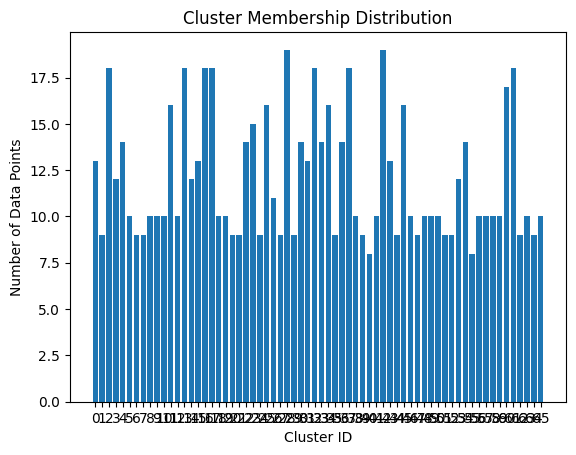

In [ ]:
plt.hist(labels, bins=np.arange(num_clusters+1)-0.5, rwidth=0.8, align='mid')
plt.xlabel('Cluster ID')
plt.ylabel('Number of Data Points')
plt.title('Cluster Membership Distribution')
plt.xticks(range(num_clusters))
plt.show()


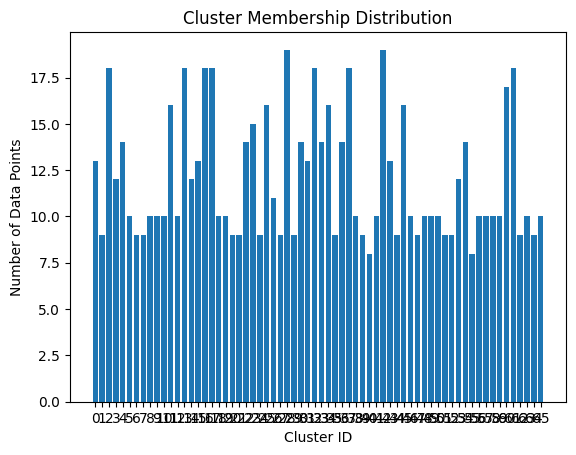

In [ ]:
plt.hist(labels, bins=np.arange(num_clusters+1)-0.5, rwidth=0.8, align='mid')
plt.xlabel('Cluster ID')
plt.ylabel('Number of Data Points')
plt.title('Cluster Membership Distribution')
plt.xticks(range(num_clusters))
plt.show()


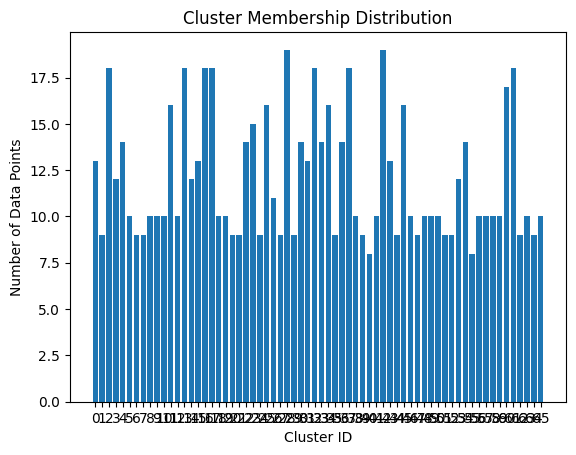

In [ ]:
plt.hist(labels, bins=np.arange(num_clusters+1)-0.5, rwidth=0.8, align='mid')
plt.xlabel('Cluster ID')
plt.ylabel('Number of Data Points')
plt.title('Cluster Membership Distribution')
plt.xticks(range(num_clusters))
plt.show()
